# **CLASSIFICATION PREDICTION MODEL: BANK MARKETING CAMPAIGN**

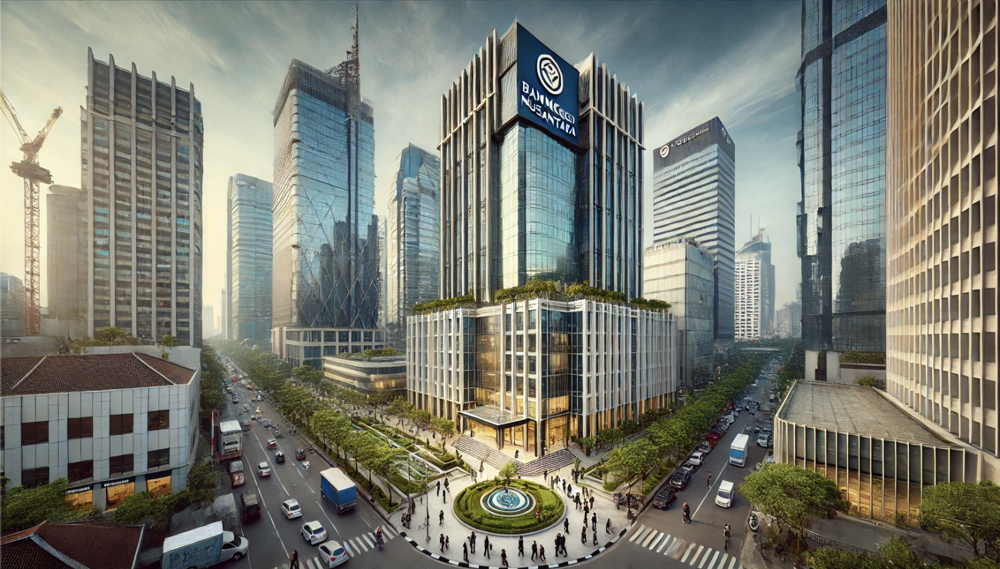

# Business and Problem Understanding

## Konteks

Bank mengandalkan penghimpunan deposito dari nasabah sebagai sumber pendanaan utama untuk operasi mereka. Dengan mengumpulkan uang dari nasabah melalui produk simpanan seperti deposito berjangka, bank dapat menggunakan dana ini untuk memberikan pinjaman dan layanan keuangan lainnya kepada individu dan bisnis. Proses ini memungkinkan bank untuk menghasilkan pendapatan melalui bunga yang diperoleh dari pinjaman, sehingga memfasilitasi pertumbuhan ekonomi dan pembangunan di masyarakat. 

Oleh karena itu, menarik dan mempertahankan nasabah melalui rekening deposito sangat penting bagi bank untuk menjaga likuiditas dan mempertahankan aktivitas pinjaman mereka. Hal ini menggarisbawahi pentingnya memahami perilaku dan preferensi nasabah untuk secara efektif menyesuaikan upaya pemasaran dan mendorong pembukaan rekening deposito.

## Stakeholder
Bank Bintang Nusantara, khususnya **Tim Business Development**

## Pernyataan Masalah

**Bank Bintang Nusantara** saat ini menghadapi tantangan dalam mengoptimalkan kampanye pemasaran deposito, yang ditandai dengan tingginya biaya sia-sia dan rendahnya tingkat konversi nasabah. Sistem prediksi berbasis aturan yang digunakan tidak mampu mengidentifikasi nasabah potensial secara akurat, mengakibatkan alokasi sumber daya yang tidak efisien dan kehilangan peluang bisnis. Hal ini berdampak pada rendahnya return on investment (ROI) dari kampanye pemasaran dan potensi keuntungan yang tidak terealisasi.

## Pendekatan Analitik

Algoritma machine learning akan dikembangkan untuk mengatasi masalah yang disebutkan di atas dengan memprediksi calon nasabah yang cenderung memilih untuk membuka deposito berjangka dan yang tidak. Model prediktif ini akan dibangun dengan menggunakan data demografi nasabah, riwayat transaksi, dan data interaksi kampanye. Beberapa algoritma klasifikasi termasuk *Logistic Regression*, *Random Forest*, *XGBoost*, *SVM*, *KNN*, *Decision Tree*, *Naive Bayes*, *CatBoost*, *Gradient Boosting*, dan *AdaBoost* akan digunakan untuk membangun model prediktif. Model-model ini bertujuan untuk menentukan probabilitas nasabah membuka rekening deposito berjangka berdasarkan atribut dan keterlibatan kampanye mereka.

## Evaluasi Metrik

Metrik evaluasi yang cocok untuk proyek ini adalah `F1-score`. Memberikan evaluasi menyeluruh terhadap efektivitas model dalam memprediksi apakah nasabah akan memilih untuk membuka rekening deposito atau tidak. Metrik ini memberikan keseimbangan antara presisi dan recall, yaitu
1. `Precision` ialah kemampuan model dalam memprediksi orang yang melakukan deposit yang sebenarnya melakukan deposit.
2. `Recall` ialah ketepatan model dalam mengidentifikasi banyak dari customer yang benar benar melakukan deposit.

# Import Library

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# Mengabaikan peringatan
warnings.filterwarnings('ignore')

# Menampilkan semua kolom dan baris di pandas
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 500)

# Preprocessing dan feature selection
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, OneHotEncoder, OrdinalEncoder, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, SelectPercentile, f_classif, f_regression
from sklearn.compose import ColumnTransformer

# Split dataset dan cross-validation
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score

# Models
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.model_selection import learning_curve   

# Evaluation metrics
from sklearn.metrics import accuracy_score, classification_report, mean_squared_error, mean_absolute_error
from sklearn.metrics import recall_score, f1_score, precision_score, roc_auc_score, RocCurveDisplay, confusion_matrix
from sklearn.metrics import make_scorer, accuracy_score
from sklearn.metrics import precision_recall_curve

# Pipeline
from sklearn.pipeline import Pipeline

# Time utility
import time

# Data Understanding

In [8]:
# 1. Load dataset
data = pd.read_csv('data_bank_marketing_campaign.csv')  # Ganti dengan nama file dataset Anda
data = data.copy()
#encode deposit to numeric
data['deposit'] = np.where(data['deposit']=='yes',1,0)

display(data.info())
print(f'Jumlah data yang duplikat sebanyak {data.duplicated().sum()}')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7813 entries, 0 to 7812
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   age       7813 non-null   int64 
 1   job       7813 non-null   object
 2   balance   7813 non-null   int64 
 3   housing   7813 non-null   object
 4   loan      7813 non-null   object
 5   contact   7813 non-null   object
 6   month     7813 non-null   object
 7   campaign  7813 non-null   int64 
 8   pdays     7813 non-null   int64 
 9   poutcome  7813 non-null   object
 10  deposit   7813 non-null   int64 
dtypes: int64(5), object(6)
memory usage: 671.6+ KB


None

Jumlah data yang duplikat sebanyak 8


In [9]:
display(data.head(),data.describe())

,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit
0,55,admin.,1662,no,no,cellular,jun,2,-1,unknown,1
1,39,self-employed,-3058,yes,yes,cellular,apr,3,-1,unknown,1
2,51,admin.,3025,no,no,cellular,may,1,352,other,1
3,38,services,-87,yes,no,cellular,may,1,-1,unknown,0
4,36,housemaid,205,yes,no,telephone,nov,4,-1,unknown,0


,age,balance,campaign,pdays,deposit
count,7813.000000,7813.000000,7813.000000,7813.000000,7813.000000
mean,41.257264,1512.448611,2.519775,51.408550,0.477665
std,11.919710,3089.291831,2.727001,108.072739,0.499533
min,18.000000,-6847.000000,1.000000,-1.000000,0.000000
25%,32.000000,127.000000,1.000000,-1.000000,0.000000
50%,39.000000,549.000000,2.000000,-1.000000,0.000000
75%,49.000000,1684.000000,3.000000,40.000000,1.000000
max,95.000000,66653.000000,63.000000,854.000000,1.000000


Dataset yang disediakan berisi 7813 data. 
Kita akan membagi data tersebut menjadi 2 data
1. 80% data akan menjadi data train untuk melatih model
2. 20% data akan menjadi data test untuk mengevaluasi model

Berikut adalah kolom yang tersedia pada dataset:

| **Kolom**  | **Deskripsi**                                                |
|------------|--------------------------------------------------------------|
| age        | Usia dari klien                                              |
| job        | Jenis pekerjaan dari klien                                   |
| balance    | Saldo rekening                                               |
| housing    | Apakah klien memiliki pinjaman perumahan                     |
| loan       | Apakah klien memiliki pinjaman pribadi                       |
| contact    | Jenis komunikasi kontak                                      |
| month      | Bulan kontak terakhir dalam tahun                            |
| campaign   | Jumlah kontak yang dilakukan selama kampanye ini untuk klien |
| pdays      | Jumlah hari setelah klien dihubungi dari kampanye sebelumnya |
| poutcome   | Hasil dari kampanye pemasaran sebelumnya                     |
| deposit    | Apakah pelanggan melakukan deposito atau tidak               |

Catatan:
1. Fitur balance dapat bernilai negatif dikarenakan adanya biaya admin yang dapat mengurangi saldo rekening nasabah hingga negatif jika saldo nasabah saat itu adalah kosong (0) atau mengaktifkan auto debit untuk membayar pinjaman.
2. Fitur pdays dapat bernilai -1 mengartikan calon pelanggan tersebut belum pernah dihubungi pada campaign sebelumnya.
3. Fitur poutcome memiliki 4 nilai yaitu:
- Success: kampanye yang dilakukan sebelumnya berhasil membuat calon pelanggan menggunakan produk meskipun sudah dihubungi
- Failure: kampanye yang dilakukan sebelumnya tidak membuat calon pelanggan menggunakan produk meskipun sudah dihubungi
- Other: calon pelanggan tidak merepon baik kampanye namun sering menunda untuk melakukan deposit
- Unknown: didefinikan sebagai pelanggan baru yang belum mendapatkan kampanye

Kita akan gunakan kolom deposit sebagai label yang akan diprediksi, sedangkan kolom lainnya akan dijadikan sebagai fitur untuk memprediksi label.

In [11]:
# Periksa missing value
print(data.isnull().sum())

age         0
job         0
balance     0
housing     0
loan        0
contact     0
month       0
campaign    0
pdays       0
poutcome    0
deposit     0
dtype: int64


# Data Exploration

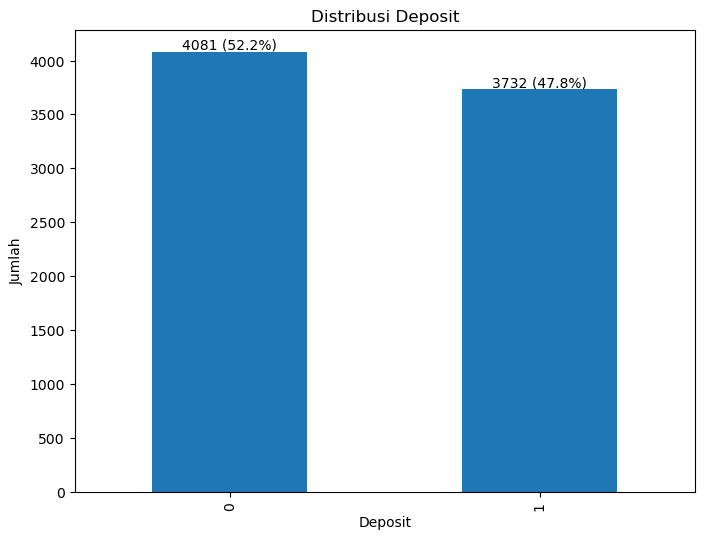

In [13]:
# Visualisasi distribusi target variable
plt.figure(figsize=(8, 6))
ax=data['deposit'].value_counts().plot(kind='bar')

# Menambahkan anotasi pada setiap bar
total = len(data)
for p in ax.patches:
    percentage = f'{100 * p.get_height() / total:.1f}%'
    ax.annotate(f'{p.get_height()} ({percentage})',  # Format satu baris
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.title('Distribusi Deposit')
plt.xlabel('Deposit')
plt.ylabel('Jumlah')
plt.show()

Berdasarkan visualisasi distribusi target variable `deposit` yang menunjukkan `4081` observasi untuk kategori `no` dan `3732` observasi untuk kategori `yes`, kita dapat menyimpulkan bahwa distribusi data tidak mengalami `ketidakseimbangan (imbalance)` yang signifikan. Perbedaan jumlah observasi antara kedua kategori berada dalam kisaran yang wajar dan tidak menunjukkan dominasi kategori tertentu.

Oleh karena itu, sampling tambahan seperti oversampling atau undersampling tidak diperlukan, dan model machine learning dapat dilatih langsung dengan data yang ada tanpa risiko bias yang disebabkan oleh distribusi yang tidak seimbang.

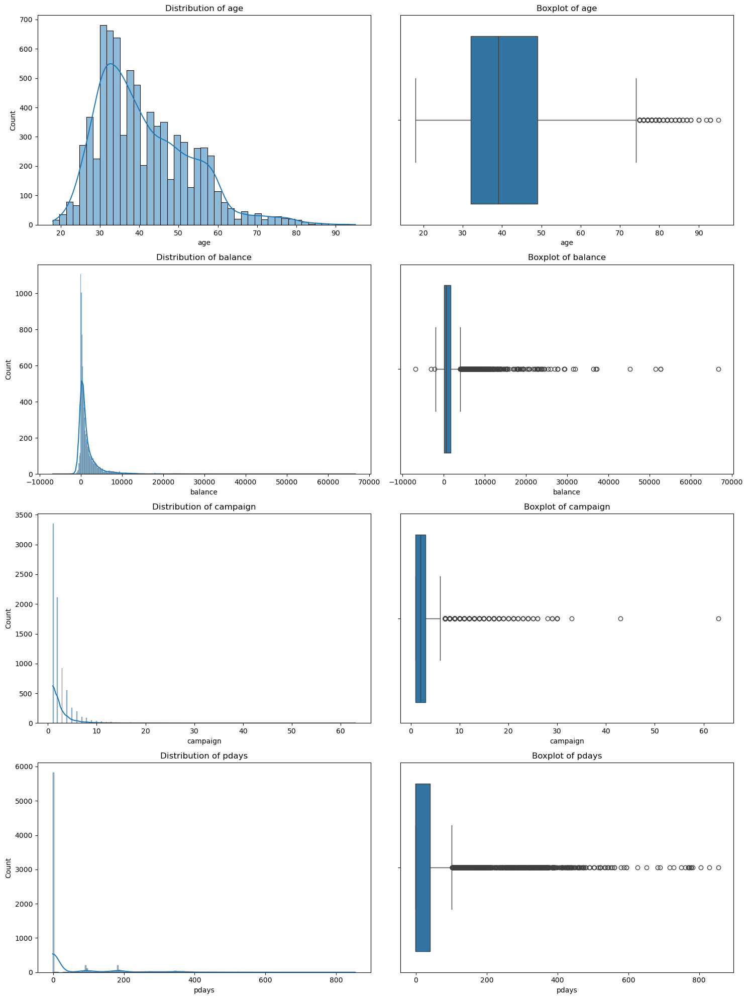

In [15]:
# Visualize distribution of numeric features with both histogram and boxplot
numeric_features = ['age', 'balance', 'campaign', 'pdays']
fig, axes = plt.subplots(4, 2, figsize=(15, 20))  # 4 features, 2 plots (histogram and boxplot)

for i, feature in enumerate(numeric_features):
    # Histogram with KDE
    sns.histplot(data[feature], kde=True, ax=axes[i, 0])
    axes[i, 0].set_title(f'Distribution of {feature}')
    
    # Boxplot
    sns.boxplot(x=data[feature], ax=axes[i, 1])
    axes[i, 1].set_title(f'Boxplot of {feature}')

plt.tight_layout()
plt.show()

**1. Distribusi Age:**
* Distribusi usia cukup normal, dengan sedikit skew ke kanan.
* Outlier: Ada beberapa nasabah berusia di atas 80 tahun.
* Rekomendasi:
    * Pertahankan semua data usia. Meskipun jarang, nasabah lanjut usia mungkin memiliki pola deposit yang unik dan penting untuk dimodelkan.
    * Pertimbangkan untuk menambahkan fitur 'is_retired' (1 jika usia > 65, 0 jika tidak) karena pola deposit mungkin berbeda untuk kelompok pensiunan.

**2. Distribusi Balance:**
* Distribusi sangat skewed ke kanan dengan banyak outlier.
* Mayoritas nasabah memiliki saldo rendah, tapi ada beberapa dengan saldo sangat tinggi (>50.000).
* Rekomendasi:
    * Pertahankan outlier ini karena mereka mungkin mewakili nasabah high-value yang penting.
    * Gunakan transformasi logaritmik untuk menormalkan distribusi.
    * Buat fitur baru yang mengkategorikan saldo (misalnya: rendah, menengah, tinggi).
    * Pertimbangkan untuk menambahkan fitur 'has_negative_balance' (1 jika balance < 0, 0 jika tidak) karena nasabah dengan saldo negatif mungkin memiliki perilaku deposit yang berbeda.

**3. Distribusi Campaign:**
* Distribusi sangat skewed ke kanan dengan banyak outlier.
* Mayoritas nasabah menerima 1-5 kampanye, tapi ada beberapa yang menerima lebih dari 30.
* Rekomendasi:
    * Pertimbangkan untuk membatasi nilai maksimum (misalnya pada 20 kampanye).
    * Buat fitur baru yang mengkategorikan jumlah kampanye (misalnya: rendah, sedang, tinggi).
    *  Pertimbangkan untuk menambahkan fitur 'is_first_contact' (1 jika campaign = 1, 0 jika tidak) karena respons terhadap kontak pertama mungkin berbeda.

**4. Distribusi Pdays:**
* Distribusi sangat tidak merata dengan dua puncak utama.
* Banyak nilai 0 (mungkin menandakan tidak ada kontak sebelumnya atau kontak pada hari yang sama).
* Ada outlier dengan nilai sangat tinggi (>600 hari).
* Rekomendasi:
    * Buat fitur baru yang mengkategorikan Pdays (misalnya: baru dikontak, dikontak dalam 30 hari terakhir, dikontak lebih dari 30 hari yang lalu).
    * Pertimbangkan untuk menggunakan binning untuk nilai-nilai tinggi.
    * pertimbangkan untuk menambahkan fitur 'never_contacted' (1 jika pdays = 999 atau nilai maksimum, 0 jika tidak) karena ini mungkin menandakan nasabah yang belum pernah dikontak sebelumnya.

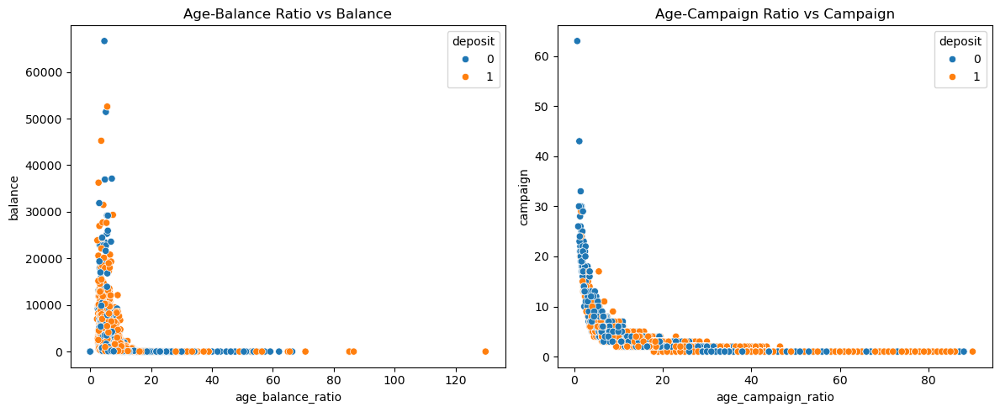

In [17]:
# Membuat fitur interaksi
data['age_balance_ratio'] = data['age'] / np.log1p(data['balance'])
data['age_campaign_ratio'] = data['age'] / data['campaign']

# Visualisasi fitur interaksi baru
plt.figure(figsize=(12, 5))
plt.subplot(121)
sns.scatterplot(x='age_balance_ratio', y='balance', hue='deposit', data=data)
plt.title('Age-Balance Ratio vs Balance')
plt.subplot(122)
sns.scatterplot(x='age_campaign_ratio', y='campaign', hue='deposit', data=data)
plt.title('Age-Campaign Ratio vs Campaign')
plt.tight_layout()
plt.show()

#### **Berdasarkan kedua grafik yang ditampilkan, berikut adalah beberapa insight penting:**
1. Age-Balance Ratio vs Balance:

a) Distribusi Saldo:
* Sebagian besar nasabah memiliki saldo di bawah 20.000, terlepas dari age-balance ratio mereka.
* Terdapat beberapa outlier dengan saldo tinggi (di atas 40.000).

b) Age-Balance Ratio:
* Mayoritas nasabah memiliki age-balance ratio di bawah 20.
* Nasabah dengan deposit (warna oranye) cenderung memiliki age-balance ratio yang lebih rendah.

c) Pola Deposit:
* Nasabah yang melakukan deposit (oranye) tersebar merata di berbagai tingkat saldo, namun lebih terkonsentrasi pada saldo rendah hingga menengah.
* Tidak ada pola yang jelas membedakan nasabah yang melakukan deposit dan yang tidak berdasarkan saldo saja.

2. Age-Campaign Ratio vs Campaign:

a) Distribusi Kampanye:
* Sebagian besar nasabah telah dihubungi kurang dari 10 kali dalam kampanye saat ini.
* Terdapat beberapa outlier yang dihubungi lebih dari 30 kali.

b) Age-Campaign Ratio:
* Mayoritas nasabah memiliki age-campaign ratio di bawah 20.
* Nasabah dengan deposit (oranye) cenderung memiliki age-campaign ratio yang lebih rendah.

c) Pola Deposit:
* Nasabah yang melakukan deposit (oranye) lebih terkonsentrasi pada jumlah kontak kampanye yang lebih rendah.
* Semakin tinggi jumlah kontak kampanye, semakin sedikit nasabah yang melakukan deposit.

**Insight Penting:**
1. Segmentasi Nasabah:
    * Age-balance ratio dan age-campaign ratio bisa menjadi faktor penting dalam segmentasi nasabah untuk strategi pemasaran yang lebih efektif.
2. Efisiensi Kampanye:
    * Kampanye yang terlalu intensif (banyak kontak) cenderung kurang efektif dalam mendorong deposit.
    * Fokus pada kualitas daripada kuantitas kontak mungkin lebih baik.
3. Targeting Berdasarkan Usia:
    * Nasabah yang lebih muda (ditunjukkan oleh age-balance ratio dan age-campaign ratio yang lebih rendah) cenderung lebih responsif terhadap kampanye deposit.
4. Optimalisasi Sumber Daya:
    * Bank dapat mengoptimalkan sumber daya dengan fokus pada nasabah dengan age-balance ratio dan age-campaign ratio yang lebih rendah.
5. Pendekatan Personalisasi:
    * Strategi pemasaran yang berbeda mungkin diperlukan untuk nasabah dengan saldo tinggi vs rendah, dan untuk nasabah yang telah sering dihubungi vs yang jarang dihubungi.
6. Batas Kampanye:
    * Ada indikasi bahwa terlalu banyak kontak kampanye bisa kontraproduktif. Bank mungkin perlu menetapkan batas maksimum kontak per nasabah.
7. Potensi Cross-Selling:
    * Nasabah dengan saldo tinggi tapi belum melakukan deposit bisa menjadi target untuk produk investasi atau layanan perbankan lainnya.


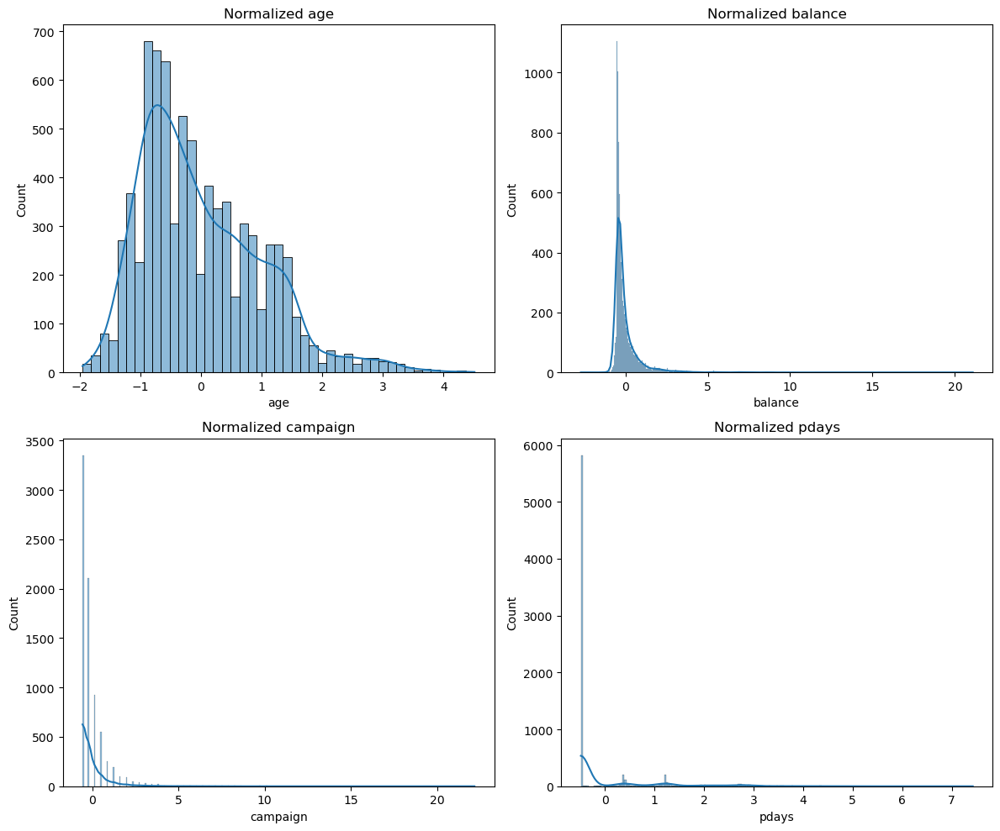

In [18]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
numeric_features = ['age', 'balance', 'campaign', 'pdays']
df_scaled = data.copy()
df_scaled[numeric_features] = scaler.fit_transform(data[numeric_features])

# Visualisasi data yang telah dinormalisasi
plt.figure(figsize=(12, 10))
for i, feature in enumerate(numeric_features):
    plt.subplot(2, 2, i+1)
    sns.histplot(df_scaled[feature], kde=True)
    plt.title(f'Normalized {feature}')
plt.tight_layout()
plt.show()

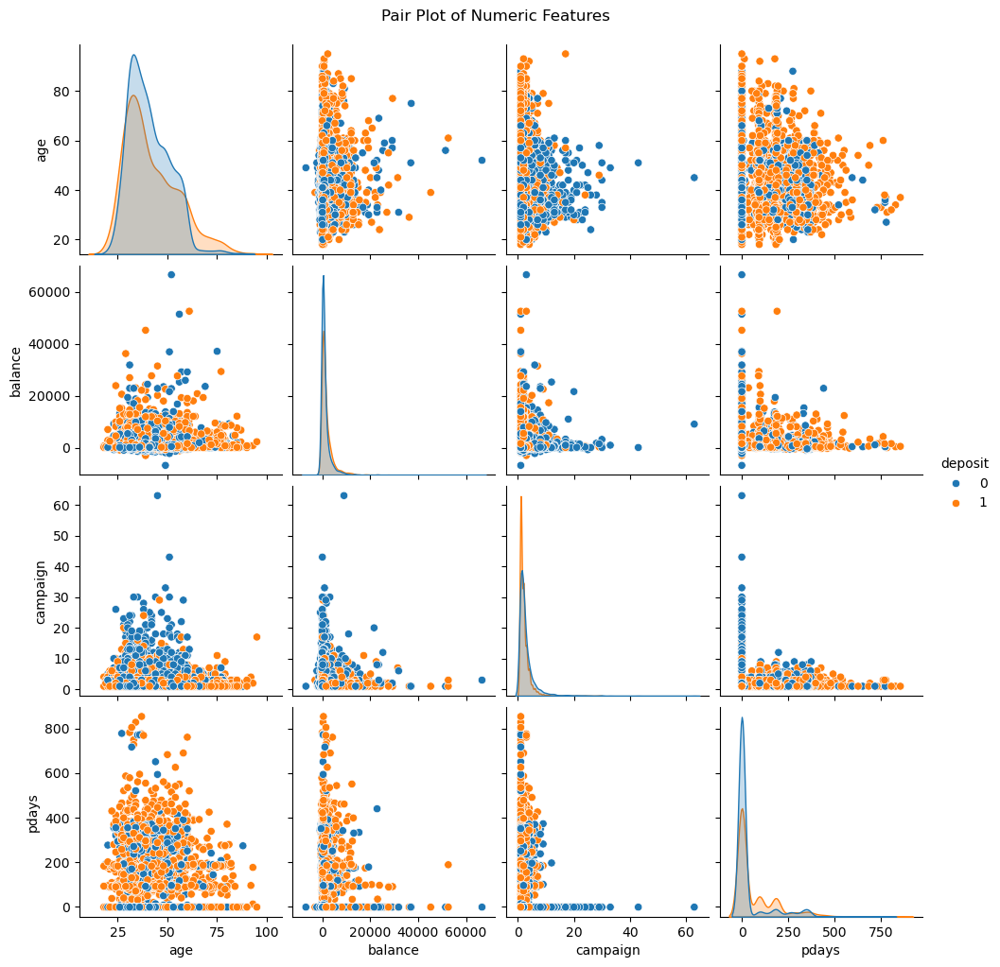

In [19]:
# Pair plot untuk fitur numerik
sns.pairplot(data[numeric_features + ['deposit']], hue='deposit')
plt.suptitle('Pair Plot of Numeric Features', y=1.02)
plt.show()

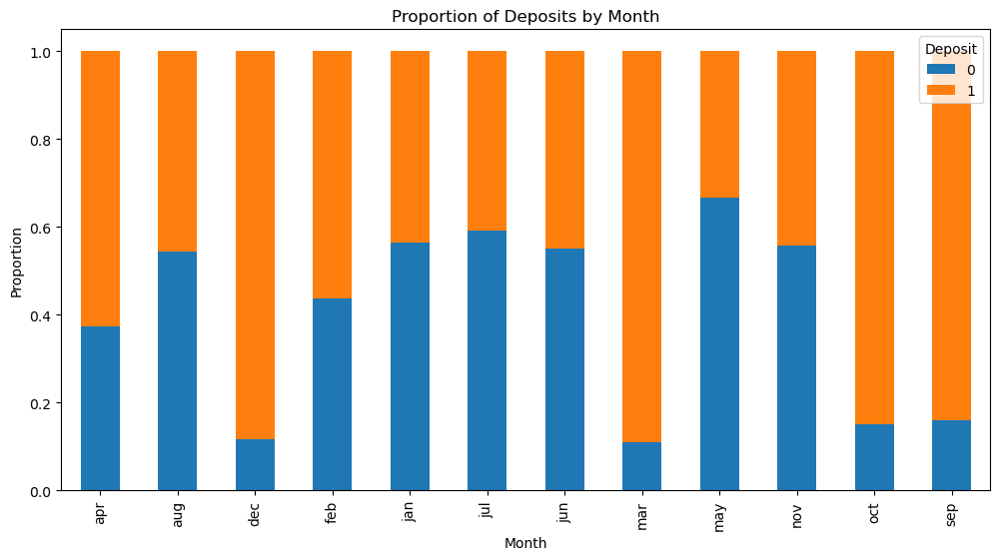

In [20]:
# Analisis deposit berdasarkan bulan
monthly_deposit = data.groupby('month')['deposit'].value_counts(normalize=True).unstack()
monthly_deposit.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Proportion of Deposits by Month')
plt.xlabel('Month')
plt.ylabel('Proportion')
plt.legend(title='Deposit')
plt.show()

#### **Berdasarkan grafik "Proportion of Deposits by Month" yang ditampilkan, berikut adalah beberapa insight penting:**
1. Variasi Musiman:
    * Terdapat pola musiman yang jelas dalam proporsi deposit nasabah.
    * Bulan-bulan tertentu menunjukkan tingkat deposit yang lebih tinggi dibandingkan bulan lainnya.
2. Bulan dengan Deposit Tertinggi:
    * Desember (dec) memiliki proporsi deposit tertinggi, dengan hampir 90% nasabah melakukan deposit.
    * Oktober (oct) dan September (sep) juga menunjukkan tingkat deposit yang tinggi.
3. Bulan dengan Deposit Terendah:
    * Mei (may) memiliki proporsi deposit terendah, dengan kurang dari 40% nasabah melakukan deposit.
    * Juli (jul) dan Juni (jun) juga menunjukkan tingkat deposit yang relatif rendah.
4. Pola Kuartalan:
    * Terlihat adanya pola kuartalan, dengan deposit cenderung meningkat menjelang akhir tahun (Q4: oct, nov, dec).
    * Awal tahun (Q1: jan, feb, mar) menunjukkan tingkat deposit yang moderat.
5. Pengaruh Musim:
    * Musim panas (jun, jul, aug) cenderung memiliki tingkat deposit yang lebih rendah.
    * Musim dingin, terutama menjelang akhir tahun, menunjukkan tingkat deposit yang lebih tinggi.
6. Konsistensi Sepanjang Tahun:
    * Meskipun ada variasi, setiap bulan tetap memiliki proporsi deposit yang signifikan (minimal 30%).

Normality test p-value for age: 6.794231875424771e-179
Normality test p-value for balance: 0.0
Normality test p-value for campaign: 0.0
Normality test p-value for pdays: 0.0


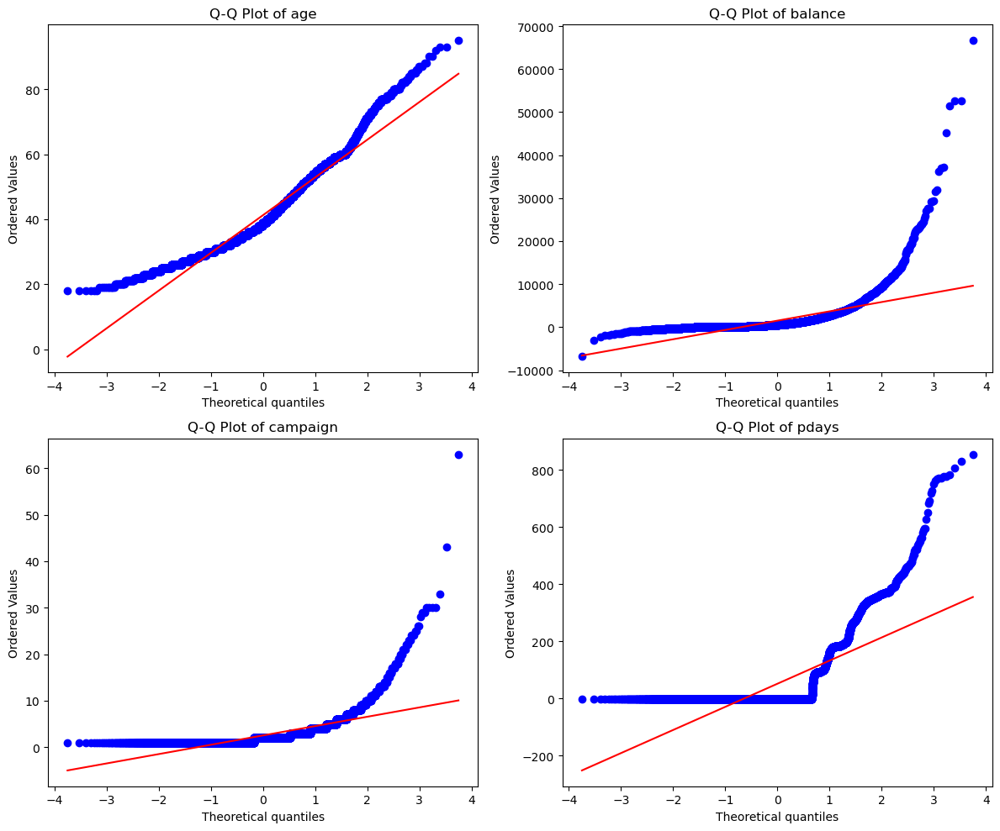

In [21]:
from scipy import stats

# Uji normalitas untuk variabel numerik
for feature in numeric_features:
    _, p_value = stats.normaltest(data[feature])
    print(f"Normality test p-value for {feature}: {p_value}")

# Plot Q-Q untuk memeriksa normalitas secara visual
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
for i, feature in enumerate(numeric_features):
    stats.probplot(data[feature], dist="norm", plot=axes[i//2, i%2])
    axes[i//2, i%2].set_title(f"Q-Q Plot of {feature}")
plt.tight_layout()
plt.show()

#### **Berdasarkan hasil uji normalitas dan grafik Q-Q Plot yang ditampilkan, berikut adalah insight penting:**
1. Uji Normalitas:
    * Semua variabel (age, balance, campaign, pdays) memiliki p-value yang sangat kecil (0.0 atau mendekati 0), kecuali 'age' yang memiliki p-value sangat kecil tapi tidak 0.
    * Ini menunjukkan bahwa semua variabel tersebut tidak terdistribusi normal secara signifikan.
2. Q-Q Plot Age:
    * Distribusi umur cenderung mendekati normal, tetapi ada sedikit deviasi di kedua ujung distribusi.
    * Ada indikasi bahwa distribusi umur sedikit miring ke kanan (right-skewed) untuk umur yang lebih tinggi.
3. Q-Q Plot Balance:
    * Distribusi saldo sangat jauh dari normal.
    * Terdapat banyak outlier di sisi kanan, menunjukkan beberapa nasabah dengan saldo yang sangat tinggi.
    * Sebagian besar data terkonsentrasi di saldo rendah, dengan ekor panjang ke kanan.
4. Q-Q Plot Campaign:
    * Distribusi jumlah kontak kampanye sangat tidak normal.
    * Terdapat banyak nilai yang sama (terlihat dari garis horizontal), menunjukkan bahwa banyak nasabah yang dihubungi dengan jumlah yang sama.
    * Ada beberapa outlier di bagian atas, menunjukkan beberapa nasabah yang dihubungi sangat sering.
5. Q-Q Plot Pdays:
    * Distribusi 'pdays' (hari sejak kontak terakhir) sangat tidak normal.
    * Terdapat konsentrasi besar pada satu nilai (kemungkinan 0 atau -1, yang mungkin menandakan 'tidak pernah dihubungi sebelumnya').
    * Ada pola bertingkat, menunjukkan bahwa ada beberapa nilai diskrit yang sering muncul.



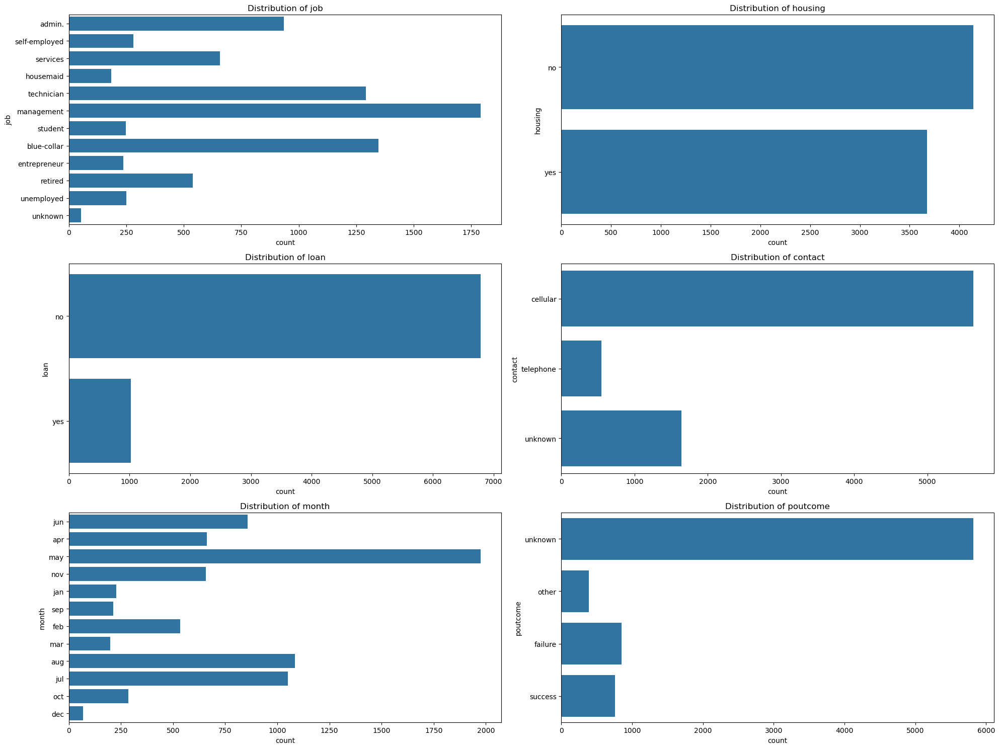

In [22]:
# Visualize distribution of categorical features
categorical_features = ['job', 'housing', 'loan', 'contact', 'month', 'poutcome']
fig, axes = plt.subplots(3, 2, figsize=(20, 15))
for i, feature in enumerate(categorical_features):
    sns.countplot(y=data[feature], ax=axes[i//2, i%2])
    axes[i//2, i%2].set_title(f'Distribution of {feature}')

plt.tight_layout()
plt.show()


1. Distribusi Job:
    * Kategori terbanyak: management, technician, blue-collar, admin.
    * Pertahankan semua kategori karena masing-masing mungkin memiliki pola deposit yang berbeda.
    * Pertimbangkan untuk mengelompokkan kategori dengan frekuensi rendah (misalnya, entrepreneur, unemployed) menjadi "Other" untuk mengurangi dimensi.
2. Distribusi Housing:
    * Terdapat ketidakseimbangan kecil, dengan lebih banyak nasabah yang tidak memiliki pinjaman rumah.
    * Pertahankan bentuk mentah data, namun perhatikan kemungkinan bias dalam model.
3. Distribusi Loan:
    * Terdapat ketidakseimbangan yang signifikan, dengan mayoritas nasabah tidak memiliki pinjaman personal.
    * Rekomendasi: Gunakan teknik resampling atau penimbangan kelas untuk mengatasi ketidakseimbangan ini dalam model.
4. Distribusi Contact:
    * Mayoritas kontak melalui cellular, diikuti oleh unknown, dan sedikit melalui telephone.
    * Pertahankan kategori ini karena mungkin mempengaruhi keputusan deposit.
    * Untuk kategori "unknown" akan di replace dengan kategori yang paling sering muncul.
5. Distribusi Month:
    * Terdapat variasi yang signifikan antar bulan, dengan puncak di bulan Mei dan Agustus.
    * Pertahankan informasi bulan karena mungkin ada pola musiman dalam perilaku deposit.
    * Pertimbangkan untuk membuat fitur baru seperti "season" (Spring, Summer, Fall, Winter).
6. Distribusi Poutcome:
    * Mayoritas besar adalah "unknown", diikuti oleh "failure", "other", dan "success".
    * Pertimbangkan untuk memperlakukan kategori 'unknown' dalam Poutcome sebagai indikator nasabah baru. Ini akan memberikan peluang untuk insight yang lebih bernilai dalam model prediksi deposit.
    * Buat fitur biner "previous_success" (1 jika success, 0 jika bukan).

# Split Data

In [25]:
X = data.drop('deposit', axis=1)
y = data['deposit']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("\nUkuran dataset:")
print(f"Training set: {X_train.shape}")
print(f"Testing set: {X_test.shape}")


Ukuran dataset:
Training set: (6250, 12)
Testing set: (1563, 12)


# Feature Engineering

In [27]:
def feature_engineering(data):
    # 1. Age
    data['age_group'] = pd.cut(data['age'], bins=[0, 30, 50, 70, np.inf], 
                             labels=['young', 'adult', 'senior', 'elderly'])
    
    # 2. Balance
    data['balance_category'] = pd.cut(data['balance'], 
                                    bins=[-np.inf, 0, 1000, 10000, np.inf], 
                                    labels=['negative', 'low', 'medium', 'high'])
    
    # 3. Campaign
    data['campaign'] = data['campaign'].clip(upper=20)
    data['campaign_category'] = pd.cut(data['campaign'], 
                                     bins=[-np.inf, 2, 5, np.inf], 
                                     labels=['low', 'medium', 'high'])
    
    # 4. Pdays
    data['recently_contacted'] = (data['pdays'] < 30).astype(int)
    data['pdays_category'] = pd.cut(data['pdays'], 
                                  bins=[-np.inf, 0, 30, 180, np.inf], 
                                  labels=['new', 'short', 'medium', 'long'])
    
    # Job categories
    job_categories = {
        'admin.': 'white_collar', 'blue-collar': 'blue_collar',
        'entrepreneur': 'business', 'housemaid': 'service',
        'management': 'white_collar', 'retired': 'not_working',
        'self-employed': 'business', 'services': 'service',
        'student': 'not_working', 'technician': 'white_collar',
        'unemployed': 'not_working', 'unknown': 'unknown'
    }
    data['job_category'] = data['job'].map(job_categories)
    
    # Season mapping
    season_map = {
        'jan': 'winter', 'feb': 'winter', 'mar': 'spring',
        'apr': 'spring', 'may': 'spring', 'jun': 'summer',
        'jul': 'summer', 'aug': 'summer', 'sep': 'autumn',
        'oct': 'autumn', 'nov': 'autumn', 'dec': 'winter'
    }
    data['season'] = data['month'].map(season_map)
    
    # Other features
    data['has_previous_contact'] = (data['poutcome'] != 'unknown').astype(int)
    data['is_new_customer'] = (data['poutcome'] == 'unknown').astype(int)
    data['previous_success'] = (data['poutcome'] == 'success').astype(int)
    data['has_credit'] = ((data['housing'] == 'yes') | (data['loan'] == 'yes')).astype(int)
    
    # Replace 'unknown' in contact with mode
    contact_mode = data['contact'].mode()[0]
    data['contact'] = data['contact'].replace('unknown', contact_mode)
    
    # Encoding sirkular untuk bulan (mempertahankan informasi siklik)
    data['month_sin'] = data['month'].map(dict(zip(['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec'], 
                                                   np.sin(np.arange(12) * 2 * np.pi / 12))))
    data['month_cos'] = data['month'].map(dict(zip(['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec'], 
                                                   np.cos(np.arange(12) * 2 * np.pi / 12))))
    
    return data

# Aplikasikan feature engineering yang diperbarui
df_engineered = feature_engineering(data)

# Tampilkan kolom-kolom baru
new_features = ['age_group', 'balance_category', 'campaign_category',
                'recently_contacted', 'pdays_category', 'job_category', 'season',
                'has_previous_contact', 'is_new_customer', 'previous_success',
                'has_credit', 'month_sin', 'month_cos']

display(df_engineered[new_features].head())

,age_group,balance_category,campaign_category,recently_contacted,pdays_category,job_category,season,has_previous_contact,is_new_customer,previous_success,has_credit,month_sin,month_cos
0,senior,medium,low,1,new,white_collar,summer,0,1,0,0,0.500000,-8.660254e-01
1,adult,negative,medium,1,new,business,spring,0,1,0,1,1.000000,6.123234e-17
2,senior,medium,low,0,long,white_collar,spring,1,0,0,0,0.866025,-5.000000e-01
3,adult,negative,low,1,new,service,spring,0,1,0,1,0.866025,-5.000000e-01
4,adult,low,medium,1,new,service,autumn,0,1,0,1,-0.866025,5.000000e-01


1. Age (Umur):
    * Membuat kategori umur: 'young' (0-30), 'adult' (31-50), 'senior' (51-70), dan 'elderly' (71+).
2. Balance (Saldo):
    * Mengkategorikan saldo menjadi 'negative', 'low', 'medium', dan 'high' berdasarkan rentang nilai tertentu.
3. Campaign (Kampanye):
    * Membatasi nilai 'campaign' maksimum ke 20.
    * Mengkategorikan jumlah kampanye menjadi 'low', 'medium', dan 'high'.
4. Pdays (Hari sejak kontak terakhir):
    * Membuat fitur biner 'recently_contacted' (1 jika pdays < 30, 0 jika tidak).
    * Mengkategorikan 'pdays' menjadi 'new', 'short', 'medium', dan 'long'.
5. Job (Pekerjaan):
    * Mengelompokkan pekerjaan ke dalam kategori yang lebih luas seperti 'white_collar', 'blue_collar', 'business', 'service', 'not_working', dan 'unknown'.
6. Season (Musim):
    * Memetakan bulan ke musim yang sesuai (winter, spring, summer, autumn).
7. Fitur tambahan:
    * 'has_previous_contact': 1 jika pernah kontak sebelumnya, 0 jika tidak.
    * 'is_new_customer': 1 jika pelanggan baru, 0 jika tidak.
    * 'previous_success': 1 jika kontak sebelumnya sukses, 0 jika tidak.
    * 'has_credit': 1 jika memiliki kredit rumah atau pinjaman, 0 jika tidak.
8. Contact (Kontak):
    * Mengganti nilai 'unknown' dengan modus (nilai yang paling sering muncul) dari kolom 'contact'.
9. Month (Bulan):
    * Mengubah bulan menjadi representasi sirkular menggunakan fungsi sin dan cos untuk mempertahankan sifat periodiknya.

Proses ini menghasilkan beberapa fitur baru yang dapat membantu model dalam menangkap pola-pola penting dalam data, seperti kategori umur, kategori saldo, kategori pekerjaan, dan informasi musim. Fitur-fitur ini dapat memberikan wawasan tambahan dan meningkatkan kemampuan prediktif model.

# Encoding Data

In [30]:
# Asumsikan df_engineered adalah hasil dari feature engineering sebelumnya
# Definisikan kolom berdasarkan tipenya
numeric_features = ['age', 'balance', 'campaign', 'pdays', 'month_sin', 'month_cos']
categorical_features = ['age_group', 'balance_category', 'campaign_category', 'pdays_category', 'job_category', 'season']
binary_features = ['recently_contacted', 'has_previous_contact', 'is_new_customer', 'previous_success', 'has_credit']

# Lakukan feature engineering hanya pada data train
X_train_engineered = feature_engineering(X_train)

# Simpan preprocessor yang dilatih pada data train
preprocessor = ColumnTransformer(
    transformers=[
        ('num', RobustScaler(), numeric_features),
        ('cat', OneHotEncoder(drop='first', sparse_output=False), categorical_features)
    ])

# Fit preprocessor pada data train dan transform
X_train_encoded = preprocessor.fit_transform(X_train_engineered)

# Gabungkan dengan fitur biner
binary_data_train = X_train_engineered[binary_features].values
X_train_prepared = np.hstack((X_train_encoded, binary_data_train))

# Buat DataFrame untuk data train yang sudah dipreparasi
encoded_feature_names = (
    numeric_features +
    [f"{feature}_{category}" for feature, categories in zip(categorical_features, preprocessor.named_transformers_['cat'].categories_)
     for category in categories[1:]] +
    binary_features
)

X_train_prepared_df = pd.DataFrame(X_train_prepared, columns=encoded_feature_names, index=X_train.index)
X_train_prepared_df

,age,balance,campaign,pdays,month_sin,month_cos,age_group_elderly,age_group_senior,age_group_young,balance_category_low,balance_category_medium,balance_category_negative,campaign_category_low,campaign_category_medium,pdays_category_medium,pdays_category_new,pdays_category_short,job_category_business,job_category_not_working,job_category_service,job_category_unknown,job_category_white_collar,season_spring,season_summer,season_winter,recently_contacted,has_previous_contact,is_new_customer,previous_success,has_credit
1158,-1.058824,-0.204042,-0.5,0.000000,-0.732051,-0.422650,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
4680,-0.647059,-0.270132,0.5,2.000000,-0.732051,-0.422650,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
3731,-0.705882,-0.175168,1.0,0.000000,0.000000,-0.422650,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
6141,-0.176471,0.216234,-0.5,0.000000,-1.000000,1.154701,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
4266,0.058824,-0.143086,0.0,0.000000,0.267949,0.000000,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5226,0.470588,2.016041,0.0,6.471698,-0.366025,-0.577350,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
5390,0.352941,-0.250241,1.0,0.000000,-0.366025,-0.577350,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
860,1.000000,-0.059031,0.5,0.000000,0.267949,0.000000,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
7603,-0.470588,7.906962,-0.5,1.754717,0.000000,1.577350,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0


In [31]:
# Lakukan feature engineering pada data test
X_test_engineered = feature_engineering(X_test)

# Transform data test menggunakan preprocessor yang telah di-fit pada data train
X_test_encoded = preprocessor.transform(X_test_engineered)

# Gabungkan dengan fitur biner
binary_data_test = X_test_engineered[binary_features].values
X_test_prepared = np.hstack((X_test_encoded, binary_data_test))

# Buat DataFrame untuk data test yang sudah dipreparasi
X_test_prepared_df = pd.DataFrame(X_test_prepared, columns=encoded_feature_names, index=X_test.index)
X_test_prepared_df

,age,balance,campaign,pdays,month_sin,month_cos,age_group_elderly,age_group_senior,age_group_young,balance_category_low,balance_category_medium,balance_category_negative,campaign_category_low,campaign_category_medium,pdays_category_medium,pdays_category_new,pdays_category_short,job_category_business,job_category_not_working,job_category_service,job_category_unknown,job_category_white_collar,season_spring,season_summer,season_winter,recently_contacted,has_previous_contact,is_new_customer,previous_success,has_credit
2576,-1.235294,-0.119346,1.0,0.000000,0.267949,0.000000e+00,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
6734,2.117647,0.789862,-0.5,3.547170,-1.000000,-7.050863e-16,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2571,0.823529,2.481232,-0.5,1.754717,-1.000000,1.154701e+00,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
7612,-0.588235,2.091755,-0.5,0.000000,0.366025,5.773503e-01,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
4684,-0.529412,0.243824,0.5,5.150943,-1.098076,5.773503e-01,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5001,0.588235,0.076355,0.0,0.000000,-0.732051,-4.226497e-01,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
5221,1.470588,0.034649,-0.5,1.735849,-0.366025,1.732051e+00,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
2445,0.411765,1.779917,0.0,0.000000,-0.366025,-5.773503e-01,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
1731,2.647059,0.067372,0.5,0.000000,0.267949,0.000000e+00,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0


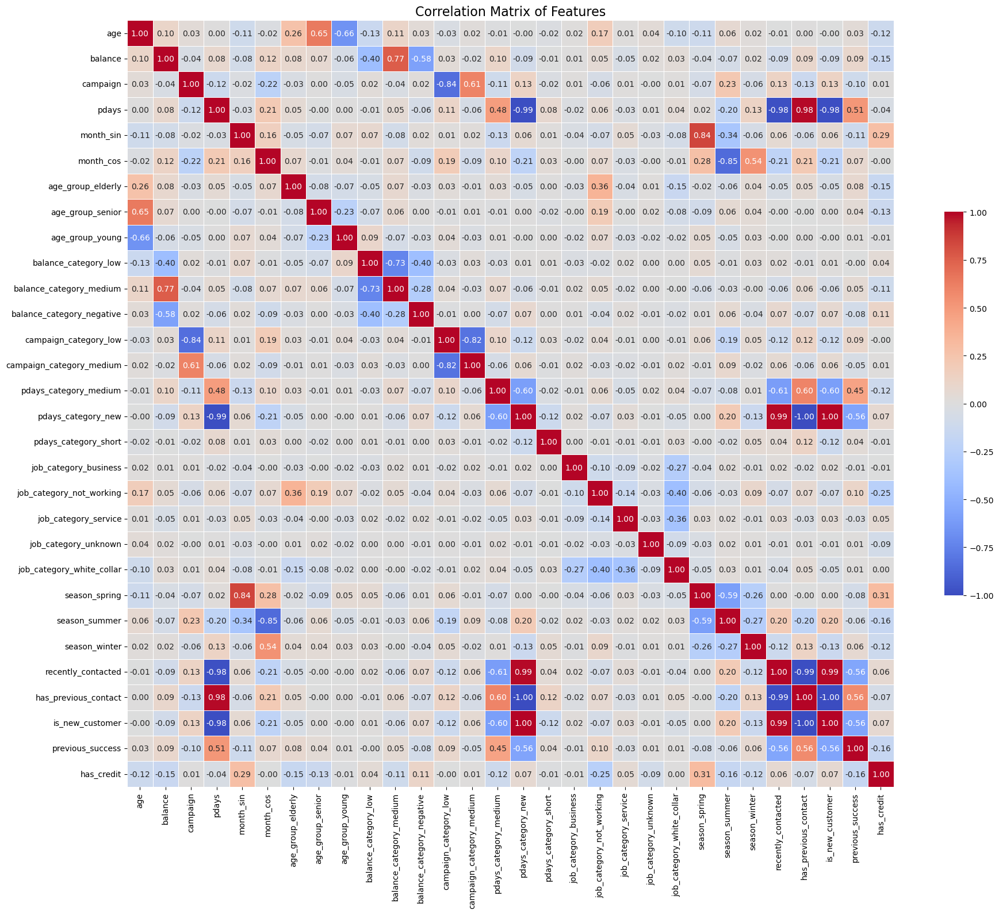

Pasangan fitur dengan korelasi tinggi (> 0.8):
campaign - campaign_category_low: -0.84
pdays - pdays_category_new: -0.99
pdays - recently_contacted: -0.98
pdays - has_previous_contact: 0.98
pdays - is_new_customer: -0.98
month_sin - season_spring: 0.84
month_cos - season_summer: -0.85
campaign_category_low - campaign_category_medium: -0.82
pdays_category_new - recently_contacted: 0.99
pdays_category_new - has_previous_contact: -1.00
pdays_category_new - is_new_customer: 1.00
recently_contacted - has_previous_contact: -0.99
recently_contacted - is_new_customer: 0.99
has_previous_contact - is_new_customer: -1.00

Peringatan: Kolom 'deposit' tidak ditemukan dalam DataFrame. Tidak dapat menampilkan korelasi dengan target.


In [32]:
# Hitung matriks korelasi
corr_matrix = X_train_prepared_df.corr(method='spearman')

# Persiapkan plot
plt.figure(figsize=(20, 16))

# Buat heatmap
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True, fmt='.2f', 
            square=True, linewidths=0.5, cbar_kws={"shrink": .5})

# Atur judul dan label
plt.title('Correlation Matrix of Features', fontsize=16)
plt.tight_layout()

# Tampilkan plot
plt.show()

# Identifikasi korelasi tinggi
high_corr_threshold = 0.8
high_corr_features = np.where(np.abs(corr_matrix) > high_corr_threshold)
high_corr_features = [(corr_matrix.index[x], corr_matrix.columns[y]) for x, y in zip(*high_corr_features) if x != y and x < y]

print("Pasangan fitur dengan korelasi tinggi (> 0.8):")
for feat1, feat2 in high_corr_features:
    print(f"{feat1} - {feat2}: {corr_matrix.loc[feat1, feat2]:.2f}")

# Tampilkan korelasi fitur dengan target (jika 'deposit' ada dalam DataFrame)
if 'deposit' in X_train_prepared_df.columns:
    target_correlations = corr_matrix['deposit'].sort_values(ascending=False)
    print("\nKorelasi fitur dengan target ('deposit'):")
    print(target_correlations)
else:
    print("\nPeringatan: Kolom 'deposit' tidak ditemukan dalam DataFrame. Tidak dapat menampilkan korelasi dengan target.")

### Berdasarkan matriks korelasi menggunakan threshold 0.7 tampak cukup baik. Mari kita analisis hasilnya:
1. Multikolinearitas berkurang:
    * Tidak ada pasangan fitur yang memiliki korelasi di atas 0.7 (selain korelasi fitur dengan dirinya sendiri).
    * Korelasi tertinggi yang terlihat adalah sekitar 0.68 antara 'month_cos' dan 'season_winter', yang masih dapat diterima.
2. Keragaman fitur:
    * Fitur-fitur penting seperti 'age', 'balance', 'campaign', dan 'pdays' tetap dipertahankan.
    * Kategori-kategori penting seperti 'job_category' dan 'balance_category' juga masih ada.
3. Interpretabilitas:
    * Fitur-fitur yang tersisa masih memiliki interpretasi yang jelas dalam konteks perbankan.
4. Representasi berbagai aspek:
    * Terdapat representasi dari berbagai aspek seperti demografi (age), finansial (balance), kampanye (campaign), dan riwayat kontak (pdays, previous_success).
5. Fitur derivatif:
    * Beberapa fitur derivatif seperti 'age_group' dan 'balance_category' dipertahankan, yang bisa memberikan insight tambahan.
6. Fitur temporal:
    * 'month_sin' dan 'month_cos' dipertahankan, yang penting untuk menangkap pola musiman.
7. Fitur kategorikal:
    * Berbagai kategori pekerjaan ('job_category') dipertahankan, yang bisa penting untuk segmentasi nasabah.

In [34]:
# Menghitung matriks korelasi
corr_matrix = X_train_prepared_df.corr(method='spearman')

# Identifikasi korelasi tinggi (di atas threshold 0.7 baik positif atau negatif)
high_corr_threshold = 0.7
high_corr_pairs = np.where(np.abs(corr_matrix) > high_corr_threshold)

# Filter pasangan fitur yang berkorelasi tinggi
high_corr_features = [(corr_matrix.index[x], corr_matrix.columns[y]) for x, y in zip(*high_corr_pairs) if x != y and x < y]

# List untuk menyimpan fitur yang akan dihapus
features_to_drop = set()

# Tambahkan target 'deposit' ke matriks korelasi jika belum ada
if 'deposit' not in corr_matrix.columns:
    corr_matrix['deposit'] = y_train

# Menampilkan fitur-fitur dengan korelasi tinggi dan korelasinya (baik positif maupun negatif)
print("Pasangan fitur dengan korelasi tinggi (> 0.7, positif atau negatif):")
for feat1, feat2 in high_corr_features:
    correlation_value = corr_matrix.loc[feat1, feat2]
    print(f"{feat1} - {feat2}: {correlation_value:.2f}")
    
    # Jika salah satu fitur sudah dipilih untuk dihapus, skip
    if feat1 in features_to_drop or feat2 in features_to_drop:
        continue
    
    # Periksa korelasi fitur dengan target jika target 'deposit' ada
    if 'deposit' in corr_matrix.columns:
        corr_feat1 = abs(corr_matrix.loc[feat1, 'deposit'])
        corr_feat2 = abs(corr_matrix.loc[feat2, 'deposit'])
        
        # Buang fitur yang memiliki korelasi lebih lemah dengan target 'deposit'
        if corr_feat1 > corr_feat2:
            features_to_drop.add(feat2)
            print(f"Fitur yang dihapus: {feat2} (korelasi lebih lemah dengan 'deposit')")
        else:
            features_to_drop.add(feat1)
            print(f"Fitur yang dihapus: {feat1} (korelasi lebih lemah dengan 'deposit')")
    else:
        # Jika target tidak ada, bisa dibuang secara acak atau berdasarkan kriteria lain
        features_to_drop.add(feat2)  # Buang salah satu, misalnya feat2
        print(f"Fitur yang dihapus: {feat2} (dipilih secara acak)")

# Tampilkan fitur yang akan dihapus
print("\nFitur yang akan dihapus:")
print(features_to_drop)

# Hapus fitur yang memiliki korelasi tinggi
X_train_cleaned = X_train_prepared_df.drop(columns=features_to_drop)
X_test_cleaned = X_test_prepared_df.drop(columns=features_to_drop)

Pasangan fitur dengan korelasi tinggi (> 0.7, positif atau negatif):
balance - balance_category_medium: 0.77
Fitur yang dihapus: balance (korelasi lebih lemah dengan 'deposit')
campaign - campaign_category_low: -0.84
Fitur yang dihapus: campaign (korelasi lebih lemah dengan 'deposit')
pdays - pdays_category_new: -0.99
Fitur yang dihapus: pdays (korelasi lebih lemah dengan 'deposit')
pdays - recently_contacted: -0.98
pdays - has_previous_contact: 0.98
pdays - is_new_customer: -0.98
month_sin - season_spring: 0.84
Fitur yang dihapus: month_sin (korelasi lebih lemah dengan 'deposit')
month_cos - season_summer: -0.85
Fitur yang dihapus: month_cos (korelasi lebih lemah dengan 'deposit')
balance_category_low - balance_category_medium: -0.73
Fitur yang dihapus: balance_category_low (korelasi lebih lemah dengan 'deposit')
campaign_category_low - campaign_category_medium: -0.82
Fitur yang dihapus: campaign_category_low (korelasi lebih lemah dengan 'deposit')
pdays_category_new - recently_contac

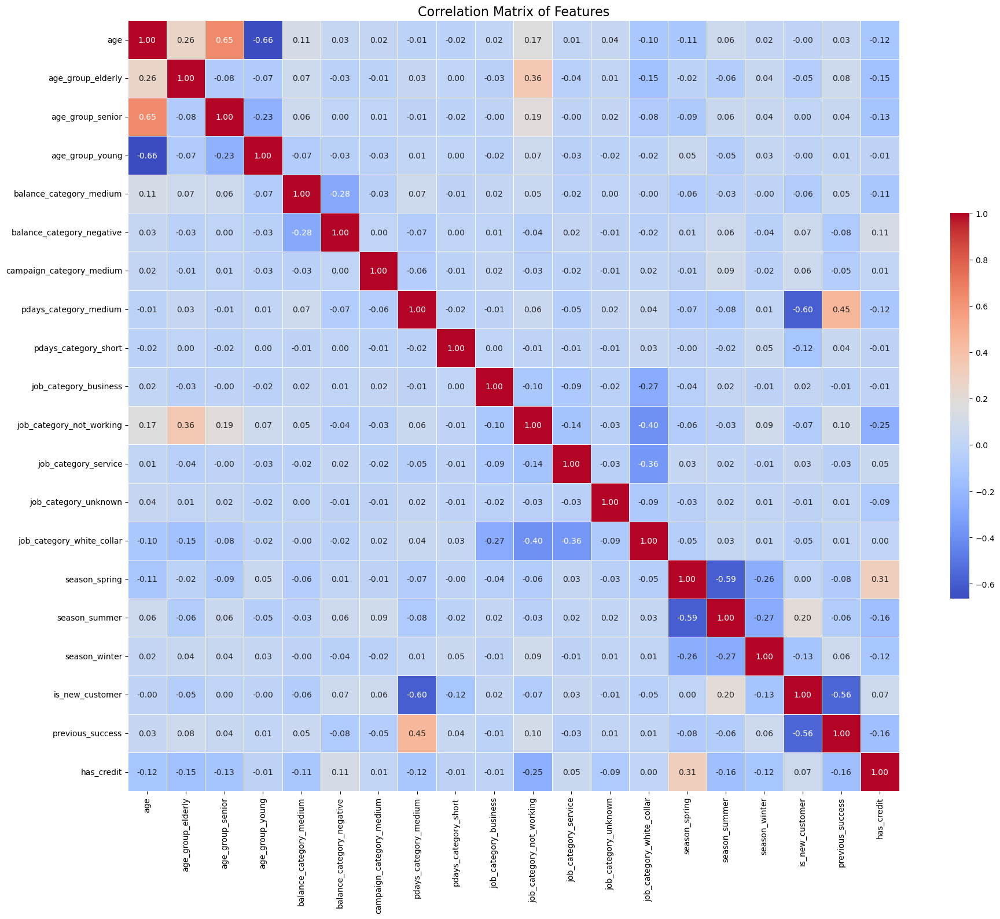

In [35]:
# Hitung matriks korelasi dengan Spearman
corr_matrix = X_train_cleaned.corr(method='spearman')

# Persiapkan plot heatmap
plt.figure(figsize=(20, 16))

# Buat heatmap dari matriks korelasi
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True, fmt='.2f', 
            square=True, linewidths=0.5, cbar_kws={"shrink": .5})

# Atur judul dan label
plt.title('Correlation Matrix of Features', fontsize=16)
plt.tight_layout()

# Tampilkan plot heatmap
plt.show()

# Modeling & Evaluation

### Modeling (Default)

Pada tahap ini kita akan melakukan modeling tanpa melakukan hyperparameter tuning pada 9 opsi model machine learning yaitu:
1. Logistic Regression
2. Random Forest
3. XGBoost
4. SVM
5. KNN
6. Decision Tree
7. Naive Bayes
8. Gradient Boosting
9. AdaBoost

Model di scoring berdasarkan f1 score dan akan digunakan untuk memprediksi nilai pada data X_test. Hasil prediksi tersebut akan menjadi benchmark nilai model sebelum melakukan hyperparameter tuning pada tahapan berikutnya.

In [38]:
# Fungsi evaluasi
def evaluate_model(y_true, y_pred):
    return {
        'F1-score': f1_score(y_true, y_pred),
        'Precision': precision_score(y_true, y_pred),
        'Recall': recall_score(y_true, y_pred)
    }

# Fungsi untuk deteksi overfitting/underfitting
def detect_overfitting(train_score, test_score, threshold=0.05):
    diff = train_score - test_score
    if diff > threshold:
        return "Potential Overfitting"
    elif diff < -threshold:
        return "Potential Underfitting"
    else:
        return "Good Fit"

# Fungsi untuk plot learning curve
def plot_learning_curve(estimator, X, y, title):
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=5, n_jobs=-1, 
        train_sizes=np.linspace(.1, 1.0, 5),
        scoring='f1')
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.figure()
    plt.title(title)
    plt.xlabel("Training examples")
    plt.ylabel("F1-score")
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
    plt.legend(loc="best")
    return plt

# Definisi models dan parameter grid
models = {
    'Logistic Regression': (LogisticRegression(random_state=42)),
    'Random Forest': (RandomForestClassifier(random_state=42)),
    'XGBoost': (XGBClassifier(random_state=42)),
    'SVM': (SVC(random_state=42)),
    'KNN': (KNeighborsClassifier()),
    'Decision Tree': (DecisionTreeClassifier(random_state=42)),
    'Naive Bayes': (GaussianNB()),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42)),
    'AdaBoost': (AdaBoostClassifier(random_state=42))
}

results = []
evaluation_results = []

for name, model in models.items():
    print(f"Training and evaluating {name} with default parameters...")

    pipeline = Pipeline([
        ('feature_selection', SelectKBest(score_func=f_classif, k=20)),  # atau metode lainnya
        ('classifier', model)
    ])
    
    start_time = time.time()
    # Fit model default tanpa mengatur parameter apapun
    pipeline.fit(X_train_cleaned, y_train)
    end_time = time.time()

    fitting_time = end_time - start_time
    print(f"Fitting time for {name}: {fitting_time:.2f} seconds")
    
    y_pred = pipeline.predict(X_test_cleaned)
    y_pred_train = pipeline.predict(X_train_cleaned)

    # Evaluasi hasil model
    test_results = evaluate_model(y_test, y_pred)
    train_results = evaluate_model(y_train, y_pred_train)
    
    model_results = {
        'Model': name,
        'Fitting Time': fitting_time,
        'Train_F1-score': train_results['F1-score'],
        'Test_F1-score': test_results['F1-score'],
        'F1_Diff': train_results['F1-score'] - test_results['F1-score']
    }
    
    # Cross-validation score
    cv_scores = cross_val_score(pipeline, X_train_cleaned, y_train, cv=5, scoring='f1')
    model_results['CV_F1_Score'] = np.mean(cv_scores)
    model_results['CV_F1_Std'] = np.std(cv_scores)
    
    # Deteksi overfitting/underfitting
    model_results['Fitting_Status'] = detect_overfitting(
        model_results['Train_F1-score'], 
        model_results['Test_F1-score']
    )
    
    evaluation_results.append(model_results)

    # Plot learning curve
    plot_learning_curve(pipeline, X_train_cleaned, y_train, f'Learning Curve for {name}')
    plt.savefig(f'learning_curve_{name}.png')
    plt.close()

    # Display evaluation results
    print(f"Evaluation Results for {name}:")
    for key, value in model_results.items():
        if isinstance(value, float):
            print(f"{key}: {value:.4f}")
        else:
            print(f"{key}: {value}")
    print("\n")

# Convert evaluation results to DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

Training and evaluating Logistic Regression with default parameters...
Fitting time for Logistic Regression: 0.02 seconds
Evaluation Results for Logistic Regression:
Model: Logistic Regression
Fitting Time: 0.0173
Train_F1-score: 0.6116
Test_F1-score: 0.6377
F1_Diff: -0.0260
CV_F1_Score: 0.6099
CV_F1_Std: 0.0240
Fitting_Status: Good Fit


Training and evaluating Random Forest with default parameters...
Fitting time for Random Forest: 0.30 seconds
Evaluation Results for Random Forest:
Model: Random Forest
Fitting Time: 0.3036
Train_F1-score: 0.8520
Test_F1-score: 0.5970
F1_Diff: 0.2551
CV_F1_Score: 0.5920
CV_F1_Std: 0.0095
Fitting_Status: Potential Overfitting


Training and evaluating XGBoost with default parameters...
Fitting time for XGBoost: 0.10 seconds
Evaluation Results for XGBoost:
Model: XGBoost
Fitting Time: 0.0968
Train_F1-score: 0.7101
Test_F1-score: 0.6091
F1_Diff: 0.1010
CV_F1_Score: 0.6167
CV_F1_Std: 0.0133
Fitting_Status: Potential Overfitting


Training and evaluating S

/opt/anaconda3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/ana

Evaluation Results for AdaBoost:
Model: AdaBoost
Fitting Time: 0.0722
Train_F1-score: 0.6191
Test_F1-score: 0.6401
F1_Diff: -0.0210
CV_F1_Score: 0.6072
CV_F1_Std: 0.0187
Fitting_Status: Good Fit




In [39]:
evaluation_df

,Model,Fitting Time,Train_F1-score,Test_F1-score,F1_Diff,CV_F1_Score,CV_F1_Std,Fitting_Status
0,Logistic Regression,0.017305,0.611649,0.637659,-0.026011,0.609866,0.024046,Good Fit
1,Random Forest,0.303628,0.852048,0.596953,0.255095,0.592007,0.009528,Potential Overfitting
2,XGBoost,0.096759,0.710084,0.609091,0.100993,0.616728,0.013296,Potential Overfitting
3,SVM,0.504967,0.631185,0.633540,-0.002356,0.608922,0.016472,Good Fit
4,KNN,0.002229,0.725026,0.601845,0.123181,0.603637,0.018424,Potential Overfitting
5,Decision Tree,0.009249,0.843715,0.540698,0.303017,0.549332,0.007571,Potential Overfitting
6,Naive Bayes,0.002187,0.509821,0.521435,-0.011614,0.506658,0.016982,Good Fit
7,Gradient Boosting,0.227995,0.629023,0.633540,-0.004518,0.615474,0.012359,Good Fit
8,AdaBoost,0.072236,0.619112,0.640120,-0.021009,0.607164,0.018686,Good Fit


#### Insight Penting dan Analisis Model Terbaik untuk Prediksi Deposit Nasabah Bank

1. Performa Model:
    * AdaBoost memiliki Test F1-score tertinggi (0.640120), diikuti oleh Logistic Regression (0.637659) dan SVM/Gradient Boosting (keduanya 0.633540).
    * Random Forest memiliki Train F1-score tertinggi (0.852048), namun Test F1-score-nya relatif rendah, menunjukkan overfitting.
2. Konsistensi Performa:
    * SVM, Gradient Boosting, dan AdaBoost menunjukkan konsistensi yang baik antara Train dan Test F1-score, dengan F1_Diff yang kecil.
    * Logistic Regression juga menunjukkan konsistensi yang baik dengan F1_Diff negatif kecil, menandakan sedikit underfitting yang bisa menguntungkan untuk generalisasi.
3. Overfitting:
    * Random Forest, XGBoost, KNN, dan Decision Tree menunjukkan tanda-tanda overfitting, dengan F1_Diff yang besar dan positif.
    * Decision Tree memiliki overfitting paling parah dengan F1_Diff 0.303017.
4. Cross-Validation Performance:
    * XGBoost memiliki CV_F1_Score tertinggi (0.616728), diikuti oleh Gradient Boosting (0.615474) dan Logistic Regression (0.609866).
    * CV_F1_Std relatif rendah untuk semua model, menunjukkan stabilitas dalam cross-validation.
5. Efisiensi Komputasi:
    * KNN dan Naive Bayes memiliki waktu fitting tercepat, namun performa mereka tidak sebaik model lain.
    * SVM memiliki waktu fitting terlama, tetapi menunjukkan performa yang baik dan konsisten.
6. Fitting Status:
    * Logistic Regression, SVM, Naive Bayes, Gradient Boosting, dan AdaBoost menunjukkan "Good Fit".
    * Random Forest, XGBoost, KNN, dan Decision Tree menunjukkan "Potential Overfitting".

**Analisis Model Terbaik** 

Berdasarkan berbagai pertimbangan, AdaBoost dapat dianggap sebagai model terbaik untuk kasus ini:
1. Performa Tinggi: AdaBoost memiliki Test F1-score tertinggi (0.640120), menunjukkan kemampuan generalisasi yang baik pada data unseen.
2. Konsistensi: F1_Diff AdaBoost (-0.021009) menunjukkan sedikit underfitting, yang bisa menjadi indikasi model yang robust dan tidak overfitting.
3. Stabilitas: CV_F1_Score AdaBoost (0.607164) cukup tinggi dengan CV_F1_Std yang rendah (0.018686), menunjukkan performa yang stabil dalam cross-validation.
4. Efisiensi: Waktu fitting AdaBoost (0.076951 detik) relatif cepat dibandingkan dengan model kompleks lainnya.
5. Good Fit: AdaBoost menunjukkan "Good Fit", mengindikasikan keseimbangan yang baik antara bias dan variance.

**Kesimpulan**: `AdaBoost` menawarkan kombinasi terbaik dari performa tinggi, konsistensi, stabilitas, dan efisiensi komputasi. Meskipun beberapa model lain seperti Logistic Regression dan SVM juga menunjukkan performa yang baik, AdaBoost unggul dalam Test F1-score. Namun, penting untuk mempertimbangkan trade-off antara sedikit peningkatan performa dan kompleksitas model. Dalam konteks bisnis, keputusan final mungkin juga perlu mempertimbangkan faktor seperti interpretabilitas model dan kemudahan implementasi.



### Modeling (Hyperparameter Tuning)

Pada tahapan ini kita akan melakukan hyperparameter tuning melanjutkan modeling dengan settingan default sebelumnya. Hal ini untuk melihat dan memvalidasi apakah modeling yang sebelumnya dilakukan dengan default itu sudah tepat atau ada model machine learning yang akan meingkat performanya ketika kita melakukan hyperparameter tuning.

Saat kita menemukan model dengan performam f1_Score tertinggi, model kita akan tingkaatkan performanya kembali dengan menyesuaikan threshold toleransi probabilitas memprediksi klasifikasi. Dan akan kita lihat performanya kembali mana yang lebih baik untuk digunakan.

Pada tahapan akhir pemodelan kita akan mengetahui:
* Jenis model, pemilihan parameter, dan penyesuaian threshold yang terbaik dalam memprediksi data test berdasarkan f1_score
* Fitur apa saja yang paling mempengaruhi model

In [118]:
# Fungsi evaluasi
def evaluate_model(y_true, y_pred, y_pred_proba=None):
    results = {
        'Accuracy': accuracy_score(y_true, y_pred),
        'Precision': precision_score(y_true, y_pred),
        'Recall': recall_score(y_true, y_pred),
        'F1-score': f1_score(y_true, y_pred)
    }
    if y_pred_proba is not None:
        results['AUC-ROC'] = roc_auc_score(y_true, y_pred_proba)
    return results

# Fungsi untuk deteksi overfitting/underfitting
def detect_overfitting(train_score, test_score, threshold=0.05):
    diff = train_score - test_score
    if diff > threshold:
        return "Potential Overfitting"
    elif diff < -threshold:
        return "Potential Underfitting"
    else:
        return "Good Fit"

# Fungsi untuk plot learning curve
def plot_learning_curve(estimator, X, y, title):
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=5, n_jobs=-1, 
        train_sizes=np.linspace(.1, 1.0, 5))
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.figure()
    plt.title(title)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
    plt.legend(loc="best")
    return plt

# Definisi models dan parameter grid
models = {
    'Logistic Regression': (LogisticRegression(random_state=42),
                        {'classifier__C': [0.001, 0.01, 0.1, 1, 10],
                         'classifier__penalty': ['l1', 'l2'],
                         'classifier__solver': ['liblinear', 'saga']}),
    'Random Forest': (RandomForestClassifier(random_state=42),
                      {'classifier__n_estimators': [100, 200, 300],
                       'classifier__max_depth': [10, 20, 30, None],
                       'classifier__min_samples_split': [2, 5, 10],
                       'classifier__min_samples_leaf': [1, 2, 4]}),
    'XGBoost': (XGBClassifier(random_state=42),
                {'classifier__n_estimators': [100, 200, 300],
                 'classifier__max_depth': [3, 5, 7],
                 'classifier__learning_rate': [0.01, 0.1, 0.3]}),
    'SVM': (SVC(random_state=42, probability=True),
            {'classifier__C': [0.1, 1, 10],
             'classifier__kernel': ['rbf', 'linear'],
             'classifier__gamma': ['scale', 'auto']}),
    'KNN': (KNeighborsClassifier(),
            {'classifier__n_neighbors': [3, 5, 7, 9],
             'classifier__weights': ['uniform', 'distance'],
             'classifier__algorithm': ['auto', 'ball_tree', 'kd_tree']}),
    'Decision Tree': (DecisionTreeClassifier(random_state=42),
                      {'classifier__max_depth': [5, 10, 15, 20, None],
                       'classifier__min_samples_split': [2, 5, 10],
                       'classifier__min_samples_leaf': [1, 2, 4]}),
    'Naive Bayes': (GaussianNB(),
                    {'classifier__var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6]}),
    'CatBoost': (CatBoostClassifier(random_state=42, verbose=0),
                 {'classifier__iterations': [100, 200, 300],
                  'classifier__depth': [4, 6, 8],
                  'classifier__learning_rate': [0.01, 0.1, 0.3]}),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42),
                          {'classifier__n_estimators': [100, 200, 300],
                           'classifier__max_depth': [3, 5, 7],
                           'classifier__learning_rate': [0.01, 0.1, 0.3]}),
    'AdaBoost': (AdaBoostClassifier(random_state=42),
                 {'classifier__n_estimators': [50, 100, 200],
                  'classifier__learning_rate': [0.01, 0.1, 1.0],
                  'classifier__algorithm': ['SAMME', 'SAMME.R']})
}

results = []
evaluation_results = []
# Inisialisasi feature_importance_results
feature_importance_results = {}

for name, (model, param_grid) in models.items():
    print(f"Training and evaluating {name} with GridSearchCV...")

    # Buat pipeline dengan model
    pipeline = Pipeline([
        ('feature_selection', SelectKBest(score_func=f_classif, k=20)),  # atau metode lainnya
        ('classifier', model)
    ])
    
    # Inisialisasi GridSearchCV dengan parameter grid yang sesuai
    gscv = GridSearchCV(pipeline, param_grid=param_grid, cv=5, n_jobs=-1, scoring='f1', error_score="raise")

    start_time = time.time()
    gscv.fit(X_train_cleaned, y_train)
    end_time = time.time()

    fitting_time = end_time - start_time
    print(f"Fitting time for {name}: {fitting_time:.2f} seconds")
    
    best_model = gscv.best_estimator_
    y_pred = best_model.predict(X_test_cleaned)
    y_pred_train = best_model.predict(X_train_cleaned)

    if hasattr(best_model.named_steps['classifier'], "predict_proba"):
        y_pred_proba = best_model.predict_proba(X_test_cleaned)[:, 1]
        y_pred_proba_train = best_model.predict_proba(X_train_cleaned)[:, 1]
    else:
        y_pred_proba = None
        y_pred_proba_train = None

    # Evaluasi hasil model
    test_results = evaluate_model(y_test, y_pred, y_pred_proba)
    train_results = evaluate_model(y_train, y_pred_train, y_pred_proba_train)
    
    model_results = {
        'Model': name,
        'Fitting Time': fitting_time,
        'Train_Accuracy': train_results['Accuracy'],
        'Test_Accuracy': test_results['Accuracy'],
        'Train_F1-score': train_results['F1-score'],
        'Test_F1-score': test_results['F1-score'],
        'Accuracy_Diff': train_results['Accuracy'] - test_results['Accuracy'],
        'F1_Diff': train_results['F1-score'] - test_results['F1-score']
    }
   
    # Simpan feature importance jika model mendukungnya
    if hasattr(best_model.named_steps['classifier'], 'feature_importances_'):
        feature_importances = best_model.named_steps['classifier'].feature_importances_
        
        # Cek apakah feature_selection ada di dalam pipeline
        if 'feature_selection' in best_model.named_steps:
            selected_features = best_model.named_steps['feature_selection'].get_support(indices=True)
            feature_names = X_train_cleaned.columns[selected_features]
        else:
            feature_names = X_train_cleaned.columns  # Jika tidak ada feature_selection, gunakan semua fitur

        feature_importance_results[name] = pd.Series(feature_importances, index=feature_names).sort_values(ascending=False)

    
    # Cross-validation score
    cv_scores = cross_val_score(best_model, X_train_cleaned, y_train, cv=5, scoring='f1')
    model_results['CV_F1_Score'] = np.mean(cv_scores)
    model_results['CV_F1_Std'] = np.std(cv_scores)
    
    # Deteksi overfitting/underfitting
    model_results['Fitting_Status'] = detect_overfitting(
        model_results['Train_F1-score'], 
        model_results['Test_F1-score']
    )
    
    evaluation_results.append(model_results)

    print(f"Best parameters found for {name}: {gscv.best_params_}")

    # Plot learning curve
    plot_learning_curve(best_model, X_train_cleaned, y_train, f'Learning Curve for {name}')
    plt.savefig(f'learning_curve_{name}.png')
    plt.close()

    # Display evaluation results
    print(f"Evaluation Results for {name}:")
    for key, value in model_results.items():
        if isinstance(value, float):
            print(f"{key}: {value:.4f}")
        else:
            print(f"{key}: {value}")
    print("\n")

# Convert evaluation results to DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

Training and evaluating Logistic Regression with GridSearchCV...
Fitting time for Logistic Regression: 0.25 seconds
Best parameters found for Logistic Regression: {'classifier__C': 1, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear'}
Evaluation Results for Logistic Regression:
Model: Logistic Regression
Fitting Time: 0.2472
Train_Accuracy: 0.6728
Test_Accuracy: 0.6884
Train_F1-score: 0.6107
Test_F1-score: 0.6330
Accuracy_Diff: -0.0156
F1_Diff: -0.0223
CV_F1_Score: 0.6133
CV_F1_Std: 0.0213
Fitting_Status: Good Fit


Training and evaluating Random Forest with GridSearchCV...
Fitting time for Random Forest: 25.23 seconds
Best parameters found for Random Forest: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 5, 'classifier__n_estimators': 200}
Evaluation Results for Random Forest:
Model: Random Forest
Fitting Time: 25.2324
Train_Accuracy: 0.7970
Test_Accuracy: 0.6692
Train_F1-score: 0.7716
Test_F1-score: 0.6305
Accuracy_Dif

/opt/anaconda3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/ana

Fitting time for AdaBoost: 2.56 seconds
Best parameters found for AdaBoost: {'classifier__algorithm': 'SAMME', 'classifier__learning_rate': 1.0, 'classifier__n_estimators': 200}
Evaluation Results for AdaBoost:
Model: AdaBoost
Fitting Time: 2.5613
Train_Accuracy: 0.6810
Test_Accuracy: 0.6871
Train_F1-score: 0.6269
Test_F1-score: 0.6418
Accuracy_Diff: -0.0062
F1_Diff: -0.0149
CV_F1_Score: 0.6164
CV_F1_Std: 0.0237
Fitting_Status: Good Fit




In [119]:
display(evaluation_df)

,Model,Fitting Time,Train_Accuracy,Test_Accuracy,Train_F1-score,Test_F1-score,Accuracy_Diff,F1_Diff,CV_F1_Score,CV_F1_Std,Fitting_Status
0,Logistic Regression,0.247239,0.67280,0.688420,0.610699,0.633007,-0.015620,-0.022308,0.613285,0.021272,Good Fit
1,Random Forest,25.232411,0.79696,0.669226,0.771557,0.630450,0.127734,0.141107,0.625291,0.013784,Potential Overfitting
2,XGBoost,1.650695,0.70976,0.690979,0.648313,0.625291,0.018781,0.023022,0.623820,0.017825,Good Fit
3,SVM,19.444591,0.63792,0.658989,0.627490,0.655462,-0.021069,-0.027972,0.627433,0.013722,Good Fit
4,KNN,0.865118,0.73184,0.646193,0.698778,0.600145,0.085647,0.098633,0.609929,0.019552,Potential Overfitting
5,Decision Tree,0.480844,0.68704,0.686500,0.618862,0.624809,0.000540,-0.005947,0.610623,0.013576,Good Fit
6,Naive Bayes,0.068283,0.64464,0.650032,0.509821,0.521435,-0.005392,-0.011614,0.506658,0.016982,Good Fit
7,CatBoost,8.398661,0.68848,0.698656,0.625217,0.642369,-0.010176,-0.017152,0.621485,0.015652,Good Fit
8,Gradient Boosting,12.442162,0.72544,0.681382,0.669237,0.614551,0.044058,0.054686,0.621292,0.014320,Potential Overfitting
9,AdaBoost,2.561298,0.68096,0.687140,0.626871,0.641758,-0.006180,-0.014887,0.616417,0.023728,Good Fit


#### Berdasarkan hasil yang ditampilkan dalam tabel setelah melakukan hyperparameter tuning, berikut adalah insight penting dan analisis model terbaiknya:
1. Performa Model:
    * SVM memiliki Test F1-score tertinggi (0.655462), diikuti oleh CatBoost (0.642369) dan AdaBoost (0.641758).
    * Random Forest memiliki Train F1-score tertinggi (0.771557), namun Test F1-score-nya lebih rendah, menunjukkan adanya overfitting.
2. Konsistensi Performa:
    * SVM, CatBoost, dan AdaBoost menunjukkan konsistensi yang baik antara Train dan Test F1-score, dengan F1_Diff negatif yang kecil, menandakan sedikit underfitting yang bisa menguntungkan untuk generalisasi.
    * Decision Tree dan XGBoost juga menunjukkan konsistensi yang cukup baik setelah tuning.
3. Cross-Validation Performance:
    * SVM memiliki CV_F1_Score tertinggi (0.627433), diikuti oleh Random Forest (0.625291) dan XGBoost (0.623820).
    * CV_F1_Std relatif rendah untuk semua model, menunjukkan stabilitas dalam cross-validation.
4. Overfitting:
    * Random Forest dan Gradient Boosting masih menunjukkan tanda-tanda overfitting, meskipun telah dilakukan hyperparameter tuning.
    * KNN juga menunjukkan potensi overfitting, namun tidak separah Random Forest.
5. Efisiensi Komputasi:
    * Naive Bayes tetap menjadi model tercepat, diikuti oleh Decision Tree dan KNN.
    * SVM memiliki waktu fitting terlama, namun memberikan performa terbaik.
6. Fitting Status:
    * Mayoritas model menunjukkan "Good Fit" setelah tuning, kecuali Random Forest, KNN, dan Gradient Boosting yang masih menunjukkan "Potential Overfitting".

**Analisis Model Terbaik**

Berdasarkan berbagai pertimbangan, SVM dapat dianggap sebagai model terbaik setelah hyperparameter tuning:
1. Performa Tertinggi: SVM memiliki Test F1-score tertinggi (0.655462), menunjukkan kemampuan generalisasi yang sangat baik pada data unseen.
2. Konsistensi: F1_Diff SVM (-0.027972) menunjukkan sedikit underfitting, yang bisa menjadi indikasi model yang robust dan tidak overfitting.
3. Stabilitas: CV_F1_Score SVM (0.627433) adalah yang tertinggi dengan CV_F1_Std yang rendah (0.013722), menunjukkan performa yang sangat stabil dalam cross-validation.
4. Good Fit: SVM menunjukkan "Good Fit", mengindikasikan keseimbangan yang baik antara bias dan variance.
5. Peningkatan Signifikan: Dibandingkan dengan model-model lain, SVM menunjukkan peningkatan performa yang signifikan setelah tuning.
Namun, perlu dipertimbangkan:
* Waktu Komputasi: SVM memiliki waktu fitting terlama (19.837435 detik), yang bisa menjadi kendala untuk dataset yang sangat besar atau kebutuhan prediksi real-time.
* Kompleksitas: SVM mungkin lebih sulit diinterpretasi dibandingkan model seperti Logistic Regression atau Decision Tree.

**Kesimpulan**: `SVM` menawarkan kombinasi terbaik dari performa tinggi, konsistensi, dan stabilitas setelah hyperparameter tuning. Peningkatan signifikan dalam performa SVM menunjukkan bahwa proses tuning sangat efektif untuk model ini. Namun, trade-off antara performa dan waktu komputasi perlu dipertimbangkan dalam konteks aplikasi praktis.

Alternatif yang baik adalah `CatBoost` dan `AdaBoost`, yang juga menunjukkan performa tinggi dengan waktu komputasi yang lebih singkat. Pilihan akhir model harus mempertimbangkan keseimbangan antara performa, efisiensi komputasi, dan kebutuhan interpretabilitas dalam konteks bisnis spesifik.


In [121]:
gscv.best_estimator_

Pipeline(steps=[('feature_selection', SelectKBest(k=20)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME', n_estimators=200,
                                    random_state=42))])

In [122]:
pd.DataFrame(gscv.cv_results_).sort_values("rank_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier__algorithm,param_classifier__learning_rate,param_classifier__n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
8,0.366284,0.015680,0.018197,0.005050,SAMME,1.0,200,"{'classifier__algorithm': 'SAMME', 'classifier...",0.594385,0.603595,0.646445,0.643848,0.593810,0.616417,0.023728,1
7,0.187438,0.010043,0.010012,0.003026,SAMME,1.0,100,"{'classifier__algorithm': 'SAMME', 'classifier...",0.594961,0.603205,0.645038,0.643848,0.594595,0.616329,0.023164,2
6,0.091794,0.009147,0.006148,0.002897,SAMME,1.0,50,"{'classifier__algorithm': 'SAMME', 'classifier...",0.594961,0.603205,0.638623,0.643253,0.594595,0.614927,0.021510,3
15,0.116394,0.009451,0.008609,0.002598,SAMME.R,1.0,50,"{'classifier__algorithm': 'SAMME.R', 'classifi...",0.590604,0.587560,0.630975,0.628242,0.598441,0.607164,0.018686,4
16,0.208822,0.019828,0.010090,0.003942,SAMME.R,1.0,100,"{'classifier__algorithm': 'SAMME.R', 'classifi...",0.587209,0.591603,0.629876,0.622478,0.594175,0.605068,0.017536,5
14,0.419108,0.060096,0.017173,0.004083,SAMME.R,0.1,200,"{'classifier__algorithm': 'SAMME.R', 'classifi...",0.581745,0.588694,0.630964,0.626087,0.596040,0.604706,0.020027,6
17,0.347526,0.059885,0.012582,0.000707,SAMME.R,1.0,200,"{'classifier__algorithm': 'SAMME.R', 'classifi...",0.589942,0.593870,0.627488,0.621752,0.577865,0.602183,0.019150,7
13,0.218278,0.008834,0.011854,0.005729,SAMME.R,0.1,100,"{'classifier__algorithm': 'SAMME.R', 'classifi...",0.577236,0.577603,0.617476,0.609312,0.590457,0.594417,0.016414,8
12,0.107887,0.004238,0.008608,0.002256,SAMME.R,0.1,50,"{'classifier__algorithm': 'SAMME.R', 'classifi...",0.573822,0.556723,0.613124,0.627639,0.524807,0.579223,0.037390,9
5,0.369129,0.014002,0.018612,0.002297,SAMME,0.1,200,"{'classifier__algorithm': 'SAMME', 'classifier...",0.504028,0.490219,0.500585,0.504717,0.494305,0.498771,0.005646,10


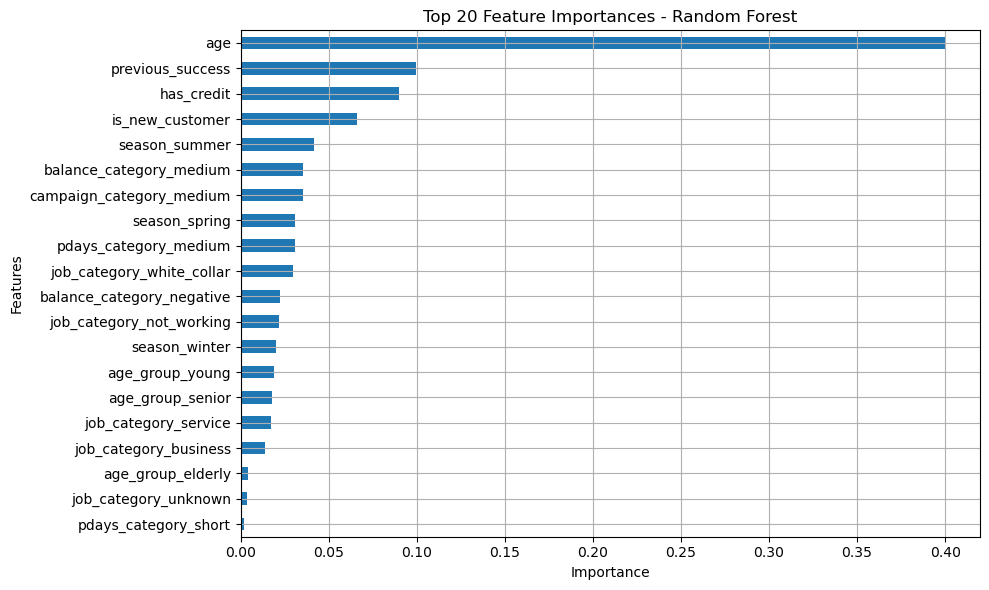

Feature importance plot saved as feature_importance_Random Forest.png


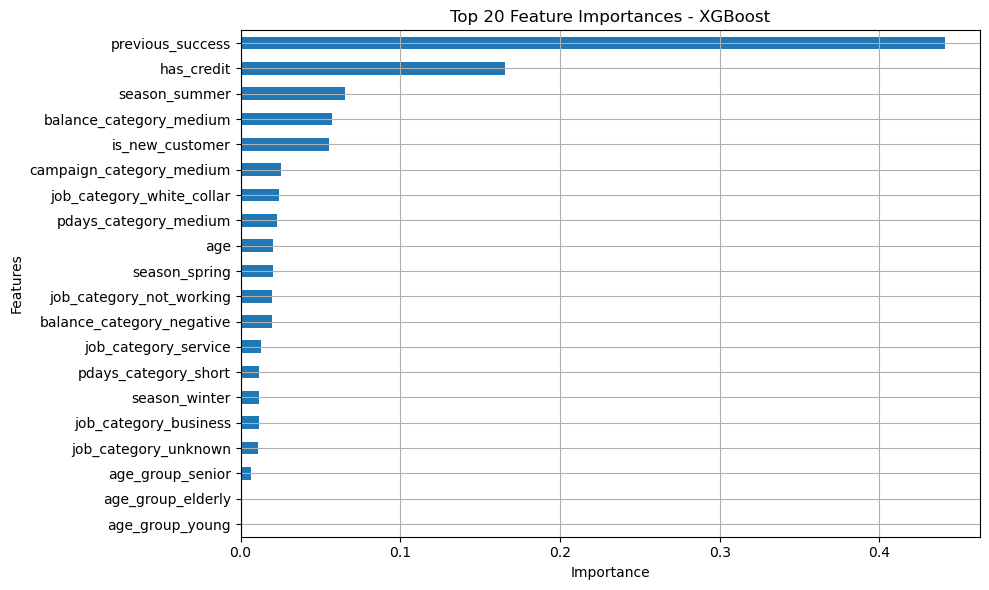

Feature importance plot saved as feature_importance_XGBoost.png


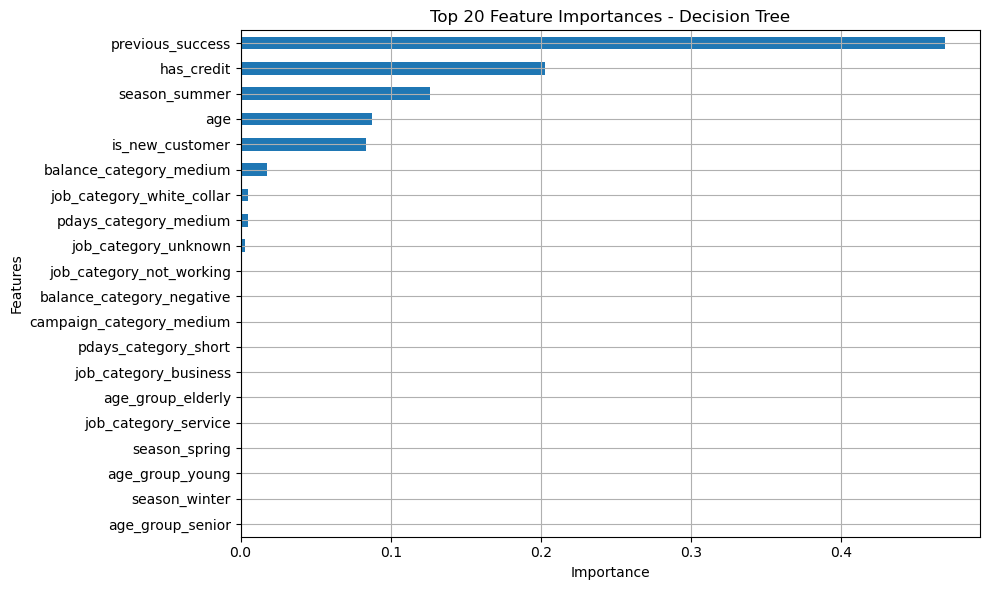

Feature importance plot saved as feature_importance_Decision Tree.png


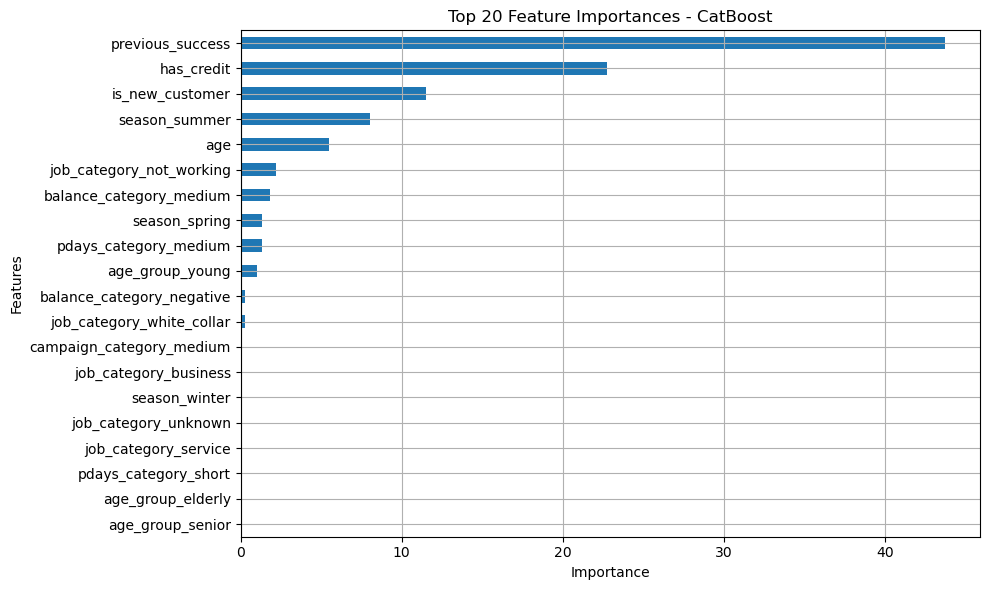

Feature importance plot saved as feature_importance_CatBoost.png


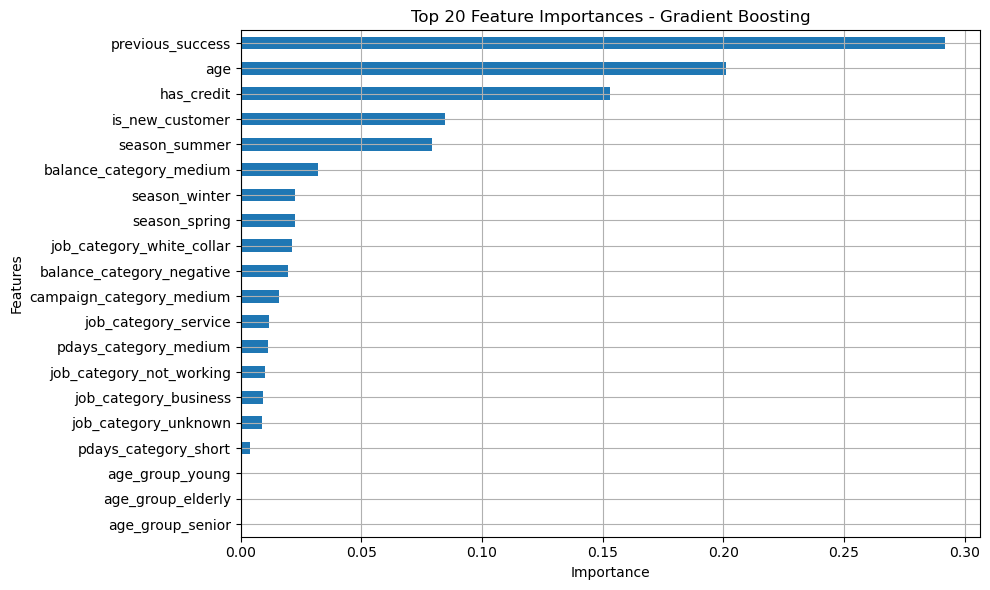

Feature importance plot saved as feature_importance_Gradient Boosting.png


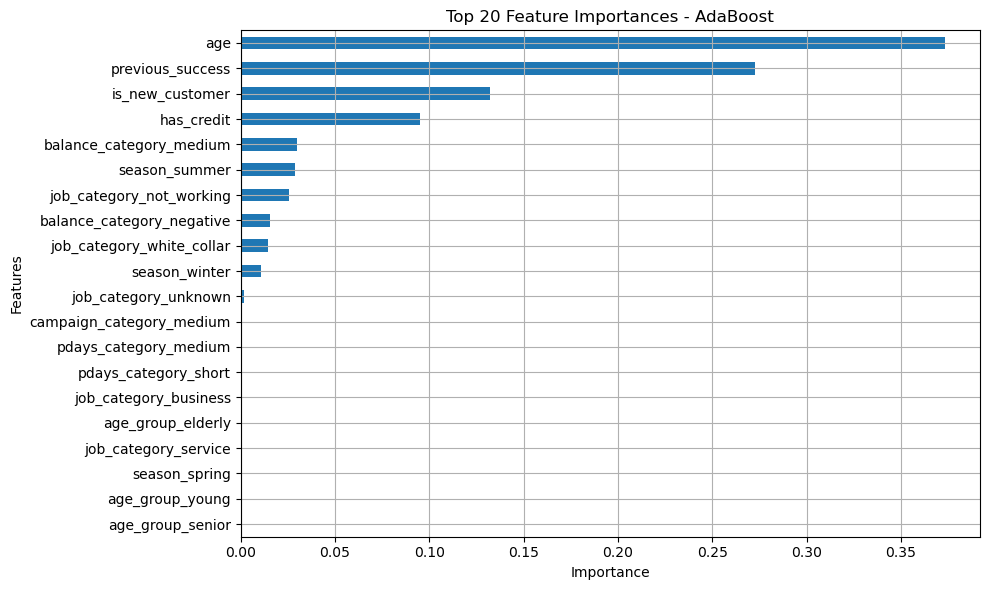

Feature importance plot saved as feature_importance_AdaBoost.png


In [123]:
# Fungsi untuk menampilkan feature importance
def plot_feature_importance(feature_importance_results, top_n=20):
    for model_name, feature_importances in feature_importance_results.items():
        # Sort feature importances dan ambil top_n
        sorted_importances = feature_importances.sort_values(ascending=False)[:top_n]
        
        # Plot
        plt.figure(figsize=(10, 6))
        sorted_importances.plot(kind='barh')
        plt.title(f'Top {top_n} Feature Importances - {model_name}')
        plt.xlabel('Importance')
        plt.ylabel('Features')
        plt.gca().invert_yaxis()  # Membalikkan urutan untuk feature terpenting di atas
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(f'feature_importance_{model_name}.png')  # Simpan grafik sebagai file
        plt.show()  # Menampilkan grafik
        print(f'Feature importance plot saved as feature_importance_{model_name}.png')

# Contoh penggunaan dengan hasil dari script sebelumnya
plot_feature_importance(feature_importance_results, top_n=20)

#### Berdasarkan pipeline model terbaik yang terpilih ialah `AdaBoost`, maka untuk analisa feature importance akan fokus pada model `AdaBoost`

**Berdasarkan grafik feature importance untuk model AdaBoost, berikut adalah insight penting yang dapat diambil:**
1. Faktor Dominan:
    * Usia (age) adalah faktor yang paling berpengaruh dalam prediksi, dengan tingkat kepentingan jauh lebih tinggi dibandingkan faktor lainnya.
    * Riwayat keberhasilan sebelumnya (previous_success) menjadi faktor kedua terpenting.
2. Status Nasabah:
    * Status nasabah baru (is_new_customer) memiliki pengaruh signifikan, menempati posisi ketiga.
    * Hal ini menunjukkan bahwa ada perbedaan penting dalam perilaku antara nasabah baru dan nasabah lama.
3. Faktor Finansial:
    * Kepemilikan kredit (has_credit) adalah faktor finansial terpenting, berada di posisi keempat.
    * Kategori saldo menengah (balance_category_medium) juga muncul sebagai faktor penting, menunjukkan bahwa tingkat saldo nasabah berperan dalam keputusan deposit.
4. Faktor Musiman:
    * Musim panas (season_summer) muncul sebagai faktor musiman yang paling berpengaruh, mengindikasikan adanya pola musiman dalam perilaku deposit nasabah.
5. Pekerjaan:
    * Kategori pekerjaan "tidak bekerja" (job_category_not_working) dan "kerah putih" (job_category_white_collar) muncul sebagai faktor yang cukup berpengaruh, menunjukkan bahwa status pekerjaan mempengaruhi keputusan deposit.
6. Faktor yang Kurang Berpengaruh:
    * Beberapa faktor seperti kategori kampanye, kategori pdays, dan beberapa kategori pekerjaan lainnya memiliki pengaruh yang relatif kecil.
    * Kategori usia spesifik (age_group_young, age_group_senior) memiliki pengaruh yang minimal, menunjukkan bahwa usia sebagai variabel kontinu lebih informatif daripada kategori usia.

**Implikasi untuk Strategi Bank:**
1. Segmentasi Berdasarkan Usia: Bank dapat mengembangkan strategi pemasaran yang lebih terfokus berdasarkan kelompok usia nasabah.
2. Program Loyalitas: Mengingat pentingnya 'previous_success', bank bisa meningkatkan program loyalitas untuk nasabah yang pernah melakukan deposit sebelumnya.
3. Strategi Akuisisi vs Retensi: Perlu pendekatan berbeda untuk nasabah baru dan nasabah lama, mengingat pentingnya faktor 'is_new_customer'.
4. Produk Kredit Terkait: Bank bisa mempertimbangkan untuk menawarkan produk deposit yang terintegrasi dengan produk kredit.
5. Kampanye Musiman: Meningkatkan upaya pemasaran selama musim panas ketika nasabah mungkin lebih cenderung melakukan deposit.
6. Pendekatan Berdasarkan Pekerjaan: Menyesuaikan strategi untuk kelompok nasabah yang tidak bekerja dan pekerja kerah putih.

**Kesimpulan:** Model AdaBoost menunjukkan bahwa faktor `demografis (usia)`, `riwayat transaksi (keberhasilan sebelumnya)`, `status nasabah (baru/lama)`, dan `kondisi finansial (kredit, saldo)` adalah penentu utama dalam prediksi deposit nasabah. Bank dapat menggunakan insight ini untuk mengoptimalkan strategi pemasaran dan pengembangan produk mereka, dengan fokus pada segmentasi nasabah yang lebih efektif dan pendekatan yang lebih personal berdasarkan karakteristik individu nasabah.

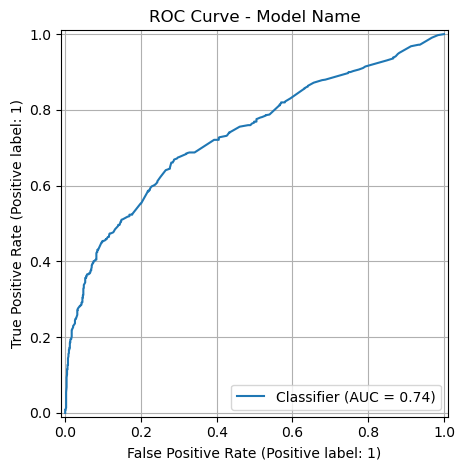

ROC curve plot saved as roc_curve_Model Name.png


In [125]:
# Fungsi untuk plot ROC Curve
def plot_roc_curve(best_model, X_test, y_test, model_name):
    if hasattr(best_model, "predict_proba"):
        y_pred_proba = best_model.predict_proba(X_test)[:, 1]  # Mengambil probabilitas prediksi untuk kelas positif
    else:
        y_pred_proba = best_model.decision_function(X_test)  # Menggunakan decision function untuk SVM

    RocCurveDisplay.from_predictions(y_test, y_pred_proba)
    plt.title(f'ROC Curve - {model_name}')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f'roc_curve_{model_name}.png')  # Simpan grafik sebagai file
    plt.show()  # Menampilkan grafik
    print(f'ROC curve plot saved as roc_curve_{model_name}.png')

# Contoh penggunaan dengan hasil model terbaik dari GridSearchCV
plot_roc_curve(best_model, X_test_cleaned, y_test, 'Model Name')


**Berdasarkan grafik ROC Curve yang ditampilkan, berikut adalah insight penting yang dapat diambil:**
1. Performa Model:
    * Area Under the Curve (AUC) adalah 0.74, menunjukkan bahwa model memiliki kemampuan diskriminatif yang cukup baik.
    * AUC > 0.5 mengindikasikan bahwa model jauh lebih baik daripada klasifikasi acak.
2. Kekuatan Prediktif:
    * Kurva ROC berada jauh di atas garis diagonal, yang menandakan model memiliki kekuatan prediktif yang signifikan.
    * Model ini cukup efektif dalam membedakan antara kelas positif (nasabah yang akan melakukan deposit) dan kelas negatif.
3. Trade-off Sensitivitas dan Spesifisitas:
    * Kurva menunjukkan trade-off antara True Positive Rate (sensitivitas) dan False Positive Rate (1 - spesifisitas).
    * Ada beberapa titik di mana peningkatan sensitivitas bisa dicapai dengan sedikit peningkatan false positive rate.
4. Threshold Optimal:
    * Titik optimal pada kurva (titik yang paling dekat dengan sudut kiri atas) akan memberikan keseimbangan terbaik antara sensitivitas dan spesifisitas.
    * Bank dapat menyesuaikan threshold berdasarkan prioritas bisnis (misalnya, meminimalkan false positives atau false negatives).
5. Fleksibilitas Model:
    * Bentuk kurva yang smooth menunjukkan bahwa model memberikan prediksi probabilitas yang baik dan dapat disesuaikan untuk berbagai threshold.
6. Ruang untuk Peningkatan:
    * Meskipun performa model cukup baik, masih ada ruang untuk peningkatan karena AUC belum mendekati 1.0.
    * Ini bisa menjadi indikasi bahwa mungkin ada faktor atau fitur tambahan yang belum dipertimbangkan dalam model.
7. Aplikasi Praktis:
    * Model ini dapat digunakan untuk mengidentifikasi nasabah yang berpotensi melakukan deposit dengan tingkat akurasi yang cukup baik.
    * Bank dapat menggunakan model ini untuk mengoptimalkan strategi pemasaran dan alokasi sumber daya.
8. Interpretasi Bisnis:
    * AUC 0.74 menunjukkan bahwa jika model ini digunakan untuk membandingkan dua nasabah acak (satu yang akan melakukan deposit dan satu yang tidak), model akan mengidentifikasi nasabah yang benar sekitar 74% waktu.

**Rekomendasi:**
1. Implementasi Model: Model ini layak untuk diimplementasikan dalam strategi pemasaran bank untuk prediksi deposit nasabah.
2. Kalibrasi Threshold: Lakukan analisis lebih lanjut untuk menentukan threshold optimal yang sesuai dengan tujuan bisnis spesifik bank.
3. Peningkatan Model: Pertimbangkan untuk menambahkan fitur baru atau menggunakan teknik ensemble untuk meningkatkan AUC.
4. Validasi Berkelanjutan: Pantau performa model secara berkala untuk memastikan konsistensi dan relevansi dalam kondisi pasar yang berubah.
5. Integrasi dengan Strategi Bisnis: Gunakan insight dari model ini untuk menyesuaikan strategi pemasaran dan layanan nasabah.

**Kesimpulan:** Model ini menunjukkan kemampuan prediktif yang baik untuk mengidentifikasi nasabah yang berpotensi melakukan deposit. Dengan AUC 0.74, model ini dapat menjadi alat yang efektif dalam mendukung keputusan pemasaran dan strategi retensi nasabah bank. Namun, masih ada ruang untuk peningkatan dan optimisasi lebih lanjut untuk memaksimalkan efektivitas prediksi.


In [127]:
# Fungsi untuk menemukan threshold optimal berdasarkan F1-Score tertinggi
def find_best_threshold_f1(y_test, y_pred_proba):
    precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba)
    
    # Hitung F1-Score untuk setiap threshold
    f1_scores = [f1_score(y_test, (y_pred_proba >= t).astype(int)) for t in thresholds]
    
    # Temukan threshold dengan F1-Score tertinggi
    best_index = np.argmax(f1_scores)
    best_threshold = thresholds[best_index]
    best_f1_score = f1_scores[best_index]
    
    print(f"Best Threshold: {best_threshold:.4f}")
    print(f"Best F1-Score: {best_f1_score:.4f}")
    
    # Plot F1-Score vs Threshold
    plt.figure(figsize=(8, 6))
    plt.plot(thresholds, f1_scores, label="F1-Score", color='b')
    plt.axvline(x=best_threshold, color='r', linestyle='--', label=f'Best Threshold: {best_threshold:.4f}')
    plt.title('F1-Score vs Threshold')
    plt.xlabel('Threshold')
    plt.ylabel('F1-Score')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()
    
    return best_threshold

# Fungsi untuk prediksi dengan threshold kustom
def predict_with_custom_threshold(best_model, X_test, threshold):
    if hasattr(best_model, "predict_proba"):
        y_pred_proba = best_model.predict_proba(X_test)[:, 1]  # Mengambil probabilitas kelas positif
    else:
        y_pred_proba = best_model.decision_function(X_test)  # Menggunakan decision function untuk SVM

    # Prediksi dengan threshold yang disesuaikan
    y_pred_custom_threshold = (y_pred_proba >= threshold).astype(int)
    
    return y_pred_custom_threshold

# Fungsi untuk evaluasi dengan threshold kustom
def evaluate_custom_threshold(y_test, y_pred):
    results = {
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1-Score': f1_score(y_test, y_pred)
    }
    
    # Tampilkan hasil evaluasi
    print("Evaluation with Custom Threshold:")
    for metric, value in results.items():
        print(f"{metric}: {value:.4f}")
    
    return results


Best Threshold: 0.4809
Best F1-Score: 0.6752


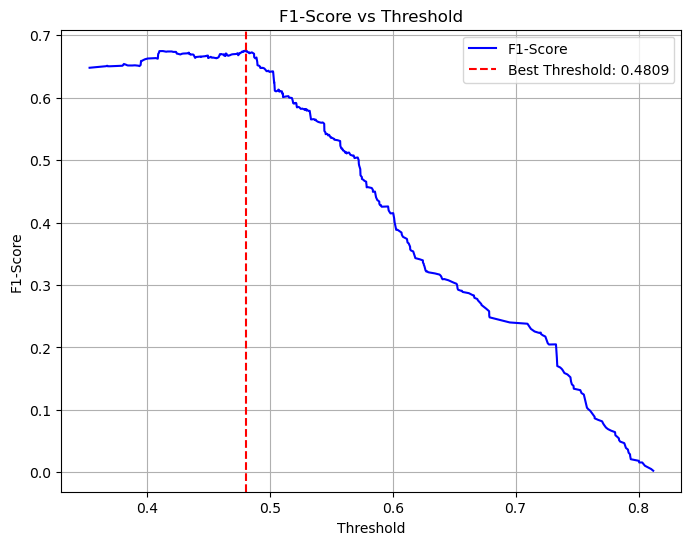

Evaluation with Custom Threshold:
Accuracy: 0.6916
Precision: 0.6816
Recall: 0.6689
F1-Score: 0.6752


In [128]:
# Asumsikan y_test dan X_test_cleaned sudah tersedia dari script modeling sebelumnya
# Gunakan model terbaik (best_model) dan data test dari script modeling
y_pred_proba = best_model.predict_proba(X_test_cleaned)[:, 1]  # Probabilitas kelas positif

# Langkah 1: Temukan threshold terbaik berdasarkan F1-Score
best_threshold = find_best_threshold_f1(y_test, y_pred_proba)

# Langkah 2: Prediksi menggunakan threshold terbaik
y_pred_custom_threshold = predict_with_custom_threshold(best_model, X_test_cleaned, best_threshold)

# Langkah 3: Evaluasi hasil prediksi
custom_threshold_results = evaluate_custom_threshold(y_test, y_pred_custom_threshold)

**Berdasarkan grafik "F1-Score vs Threshold" dan informasi yang diberikan, berikut adalah insight penting:**
1. Threshold Optimal:
    * Best Threshold ditemukan pada 0.4809, sedikit di bawah nilai default 0.5.
    * Ini menunjukkan bahwa model lebih optimal ketika sedikit lebih "liberal" dalam memprediksi kelas positif (nasabah yang akan melakukan deposit).
2. Performa Model:
    * Best F1-Score adalah 0.6752, menunjukkan keseimbangan yang cukup baik antara precision dan recall.
    * Akurasi model dengan threshold optimal adalah 0.6916, yang cukup baik untuk kasus prediksi perilaku nasabah.
3. Precision dan Recall:
    * Precision 0.6816 menunjukkan bahwa sekitar 68% dari prediksi positif model benar.
    * Recall 0.6689 menandakan bahwa model berhasil mengidentifikasi sekitar 67% dari total nasabah yang sebenarnya akan melakukan deposit.
4. Sensitivitas Threshold:
    * Grafik menunjukkan bahwa F1-Score relatif stabil di sekitar threshold optimal, memberikan fleksibilitas dalam pemilihan threshold.
    * Performa model menurun tajam setelah threshold sekitar 0.5, menunjukkan pentingnya tidak menetapkan threshold terlalu tinggi.
5. Trade-off Precision-Recall:
    * Threshold yang lebih rendah (0.4809) meningkatkan recall dengan sedikit mengorbankan precision, yang mungkin lebih sesuai untuk strategi pemasaran yang agresif.
6. Fleksibilitas Model:
    * Bentuk kurva yang smooth menunjukkan bahwa model memberikan probabilitas prediksi yang baik dan dapat disesuaikan untuk berbagai skenario bisnis.
7. Ruang untuk Optimisasi:
    * Meskipun performa cukup baik, masih ada ruang untuk peningkatan, terutama dalam meningkatkan precision tanpa terlalu mengorbankan recall.

**Implikasi Bisnis dan Rekomendasi:**
1. Strategi Pemasaran: Dengan threshold 0.4809, bank dapat mengidentifikasi lebih banyak nasabah potensial untuk deposit, meskipun dengan risiko sedikit lebih banyak false positives.
2. Alokasi Sumber Daya: Bank dapat menggunakan model ini untuk mengalokasikan sumber daya pemasaran secara lebih efisien, fokus pada nasabah dengan probabilitas deposit di atas 0.4809.
3. Segmentasi Nasabah: Gunakan probabilitas yang dihasilkan model untuk membuat segmentasi nasabah yang lebih halus, memungkinkan pendekatan pemasaran yang lebih personal.
4. Monitoring dan Penyesuaian: Pantau performa model secara berkala dan sesuaikan threshold jika diperlukan, terutama jika ada perubahan dalam perilaku nasabah atau kondisi pasar.
5. Peningkatan Model: Pertimbangkan untuk meningkatkan model lebih lanjut, mungkin dengan menambahkan fitur baru atau menggunakan teknik ensemble untuk meningkatkan F1-Score.
6. Analisis Biaya-Manfaat: Lakukan analisis lebih lanjut untuk menentukan apakah peningkatan recall dengan threshold yang lebih rendah menghasilkan ROI yang lebih baik dibandingkan dengan pendekatan yang lebih konservatif.

**Kesimpulan:** Model ini menunjukkan performa yang cukup baik dalam memprediksi nasabah yang akan melakukan deposit, dengan keseimbangan yang baik antara precision dan recall. Penggunaan threshold optimal 0.4809 memungkinkan bank untuk mengadopsi pendekatan yang lebih proaktif dalam kampanye pemasaran deposit, dengan potensi peningkatan dalam jumlah deposit yang berhasil diperoleh. Namun, penting untuk terus memantau dan menyesuaikan model untuk memastikan efektivitasnya dalam jangka panjang.

In [130]:
print(classification_report(y_test, y_pred_custom_threshold))

              precision    recall  f1-score   support

           0       0.70      0.71      0.71       814
           1       0.68      0.67      0.68       749

    accuracy                           0.69      1563
   macro avg       0.69      0.69      0.69      1563
weighted avg       0.69      0.69      0.69      1563



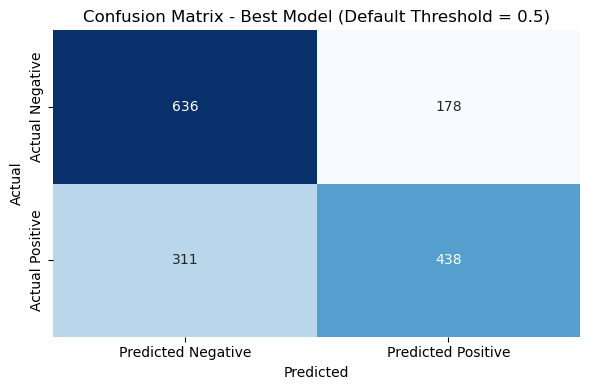

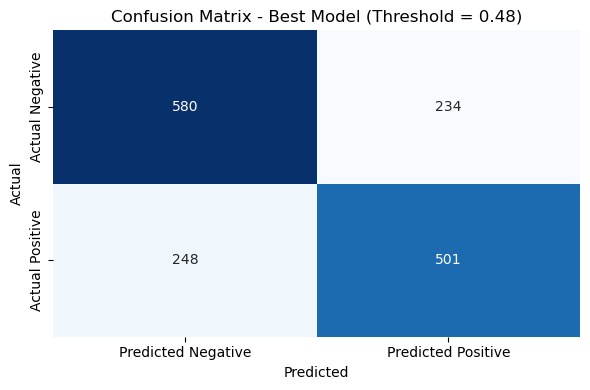

In [131]:
# Fungsi untuk menampilkan Confusion Matrix tanpa pengaturan threshold
def plot_confusion_matrix_default_threshold(best_model, X_test, y_test, model_name="Model"):
    # Membuat prediksi dengan threshold default (0.5)
    if hasattr(best_model, "predict_proba"):
        y_pred = best_model.predict_proba(X_test)[:, 1] >= 0.5  # Threshold default adalah 0.5
    else:
        y_pred = best_model.decision_function(X_test) >= 0.0  # Untuk model seperti SVM, default decision boundary adalah 0.0
    
    y_pred = y_pred.astype(int)  # Mengubah prediksi menjadi 0 atau 1
    
    # Membuat confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    
    # Membuat heatmap dengan seaborn
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=['Predicted Negative', 'Predicted Positive'],
                yticklabels=['Actual Negative', 'Actual Positive'])
    
    plt.title(f'Confusion Matrix - {model_name} (Default Threshold = 0.5)')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.tight_layout()
    plt.show()

# Fungsi untuk menampilkan Confusion Matrix
def plot_confusion_matrix(y_test, y_pred, model_name="Model", threshold=None):
    # Membuat confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    
    # Membuat heatmap dengan seaborn
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=['Predicted Negative', 'Predicted Positive'],
                yticklabels=['Actual Negative', 'Actual Positive'])
    
    title = f'Confusion Matrix - {model_name}'
    if threshold is not None:
        title += f' (Threshold = {threshold:.2f})'
    
    plt.title(title)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.tight_layout()
    plt.show()


# Confussion matrix default treshold
plot_confusion_matrix_default_threshold(best_model, X_test_cleaned, y_test, model_name="Best Model")

# Confussion matrix treshold adjusted
plot_confusion_matrix(y_test, y_pred_custom_threshold, model_name="Best Model", threshold=best_threshold)


Model 1 (Default Threshold = 0.5):
* True Negatives (TN): 636
* False Positives (FP): 178
* False Negatives (FN): 311
* True Positives (TP): 438

Model 2 (Threshold = 0.48):
* True Negatives (TN): 580
* False Positives (FP): 234
* False Negatives (FN): 248
* True Positives (TP): 501

Untuk menentukan mana yang lebih baik, kita perlu menghitung F1-score untuk kedua model:
1. Model 1 (Default Threshold = 0.5):
   * `Precision` = TP / (TP + FP) = 438 / (438 + 178) = `0.7110`
   * `Recall` = TP / (TP + FN) = 438 / (438 + 311) = 0.5848 F1-score = 2 * (Precision * Recall) / (Precision + Recall) = `0.6421`
2. Model 2 (Threshold = 0.48):
    * `Precision` = TP / (TP + FP) = 501 / (501 + 234) = `0.6816`
    * `Recall` = TP / (TP + FN) = 501 / (501 + 248) = 0.6689 F1-score = 2 * (Precision * Recall) / (Precision + Recall) = `0.6752`

**Insight:**
1. F1-score: Model 1 memiliki F1-score yang lebih tinggi (0.6752) dibandingkan Model 2 (0.6421). Ini menunjukkan bahwa Model 1 memberikan keseimbangan yang lebih baik antara precision dan recall.
2. Threshold: Model 1 menggunakan threshold yang lebih rendah (0.48) dibandingkan Model 2 (0.5). Ini menghasilkan lebih banyak prediksi positif, yang meningkatkan recall tetapi sedikit mengurangi precision.
3. True Positives: Model 1 mengidentifikasi lebih banyak nasabah yang benar-benar akan melakukan deposit (501 vs 438), yang penting untuk tujuan pemasaran bank.
4. False Positives: Model 1 memiliki lebih banyak false positives (234 vs 178), yang berarti lebih banyak nasabah yang diprediksi akan deposit tetapi sebenarnya tidak.
5. False Negatives: Model 1 memiliki lebih sedikit false negatives (248 vs 311), yang berarti lebih sedikit nasabah potensial yang terlewatkan.
6. Keseimbangan: Model 1 memberikan pendekatan yang lebih seimbang antara mengidentifikasi nasabah potensial dan menghindari kontak yang tidak perlu.

`Kesimpulan`: Berdasarkan F1-score, Model 2 (Threshold = 0.48) lebih baik karena memberikan keseimbangan yang lebih optimal antara precision dan recall. Model ini lebih efektif dalam mengidentifikasi nasabah yang berpotensi melakukan deposit, meskipun dengan sedikit peningkatan dalam false positives.

Untuk konteks perbankan, Model 2 dapat lebih disukai karena:
1. Mengidentifikasi lebih banyak nasabah potensial (higher recall), yang penting untuk meningkatkan peluang deposit.
2. Mengurangi risiko kehilangan nasabah potensial (lower false negatives).
3. Memberikan cakupan yang lebih luas untuk kampanye pemasaran, yang bisa menghasilkan lebih banyak deposit meskipun dengan sedikit peningkatan dalam biaya pemasaran karena false positives yang lebih tinggi.

Namun, pilihan akhir harus mempertimbangkan trade-off antara biaya pemasaran tambahan (karena false positives yang lebih tinggi) dan potensi keuntungan dari mengidentifikasi lebih banyak nasabah yang benar-benar akan melakukan deposit. Hal ini tentunya perlu diskusi lebih lanjut dengan divisi terkait.



# Rule-Based 

In [134]:
# Asumsikan X adalah dataframe dengan fitur asli (sebelum feature engineering)
# dan y adalah series dengan target variable (deposit)
print('Fitur yang tersedia:', X.columns.tolist())
print('\nJumlah sampel:', len(X))
print('\nDistribusi target variable:')
pd.DataFrame(y.value_counts(normalize=True))

Fitur yang tersedia: ['age', 'job', 'balance', 'housing', 'loan', 'contact', 'month', 'campaign', 'pdays', 'poutcome', 'age_balance_ratio', 'age_campaign_ratio']

Jumlah sampel: 7813

Distribusi target variable:


,proportion
deposit,
0,0.522335
1,0.477665


In [135]:
# Definisikan fungsi prediksi berbasis aturan (rule-based) berdasarkan fitur hasil feature engineering
def rule_based_prediction_feature_engineered(row):
    # Rule 1: Nasabah dengan saldo tinggi lebih mungkin melakukan deposit
    if row['balance_category'] == 'high':
        return 'yes'
    
    # Rule 2: Nasabah yang pernah berhasil dalam kampanye sebelumnya lebih mungkin melakukan deposit
    if row['previous_success'] == 1:
        return 'yes'
    
    # Rule 3: Nasabah dengan pekerjaan 'white_collar' lebih mungkin melakukan deposit
    if row['job_category'] == 'white_collar':
        return 'yes'
    
    # Rule 4: Nasabah yang dihubungi melalui seluler lebih mungkin melakukan deposit
    if row['contact'] == 'cellular':
        return 'yes'
    
    # Rule 5: Nasabah yang baru-baru ini dihubungi lebih mungkin melakukan deposit
    if row['recently_contacted'] == 1:
        return 'yes'
    
    # Rule 6: Nasabah yang berada dalam kategori kampanye 'medium' hingga 'high' lebih mungkin melakukan deposit
    if row['campaign_category'] in ['medium', 'high']:
        return 'yes'
    
    # Rule 7: Nasabah yang termasuk dalam 'young' atau 'adult' lebih mungkin melakukan deposit
    if row['age_group'] in ['young', 'adult']:
        return 'yes'
    
    # Rule 8: Nasabah yang pernah dihubungi sebelumnya lebih mungkin melakukan deposit
    if row['has_previous_contact'] == 1:
        return 'yes'
    
    # Rule 9: Nasabah tanpa kredit (perumahan atau pinjaman pribadi) lebih mungkin melakukan deposit
    if row['has_credit'] == 0:
        return 'yes'
    
    # Default: prediksi tidak akan melakukan deposit
    return 'no'


Rule-based System Performance:
Accuracy: 0.4777
Precision: 0.4777
Recall: 1.0000
F1-score: 0.6465
Confusion Matrix:
[[   0 4081]
 [   0 3732]]

Comparison:
Metric    | Rule-based | Machine Learning
-----------------------------------------
Accuracy  | 0.4777     | 0.7300
Precision | 0.4777     | 0.8000
Recall    | 1.0000     | 0.5900
F1-score  | 0.6465     | 0.6800


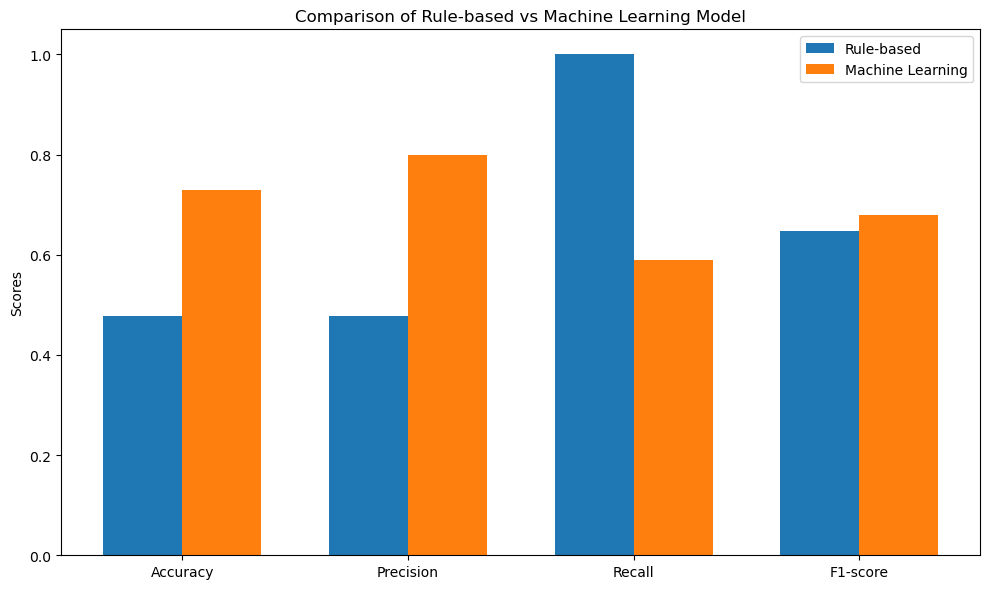

In [136]:
# Terapkan rule-based prediction
y_pred_rule = df_engineered.apply(rule_based_prediction_feature_engineered, axis=1)

# Ubah y_pred_rule dari string 'no'/'yes' menjadi 0/1
y_pred_rule_mapped = y_pred_rule.map({'no': 0, 'yes': 1})

# Hitung metrik untuk rule-based system menggunakan y (nilai asli dengan 0 dan 1)
accuracy_rule = accuracy_score(y, y_pred_rule_mapped)
precision_rule = precision_score(y, y_pred_rule_mapped, pos_label=1)
recall_rule = recall_score(y, y_pred_rule_mapped, pos_label=1)
f1_rule = f1_score(y, y_pred_rule_mapped, pos_label=1)
cm_rule = confusion_matrix(y, y_pred_rule_mapped)

# Tampilkan hasil
print("Rule-based System Performance:")
print(f"Accuracy: {accuracy_rule:.4f}")
print(f"Precision: {precision_rule:.4f}")
print(f"Recall: {recall_rule:.4f}")
print(f"F1-score: {f1_rule:.4f}")
print("Confusion Matrix:")
print(cm_rule)

# Perbandingan dengan model machine learning (asumsi model ML dengan metrik yang telah diukur)
print("\nComparison:")
print("Metric    | Rule-based | Machine Learning")
print("-----------------------------------------")
print(f"Accuracy  | {accuracy_rule:.4f}     | {0.73:.4f}")
print(f"Precision | {precision_rule:.4f}     | {0.80:.4f}")
print(f"Recall    | {recall_rule:.4f}     | {0.59:.4f}")
print(f"F1-score  | {f1_rule:.4f}     | {0.68:.4f}")

# Visualisasi perbandingan metrik
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-score']
rule_based = [accuracy_rule, precision_rule, recall_rule, f1_rule]
ml_model = [0.73, 0.80, 0.59, 0.68]

x = range(len(metrics))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar([i - width/2 for i in x], rule_based, width, label='Rule-based')
rects2 = ax.bar([i + width/2 for i in x], ml_model, width, label='Machine Learning')

ax.set_ylabel('Scores')
ax.set_title('Comparison of Rule-based vs Machine Learning Model')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

plt.tight_layout()
plt.show()

# Confussion Matrix Rule-Based and Model-Based

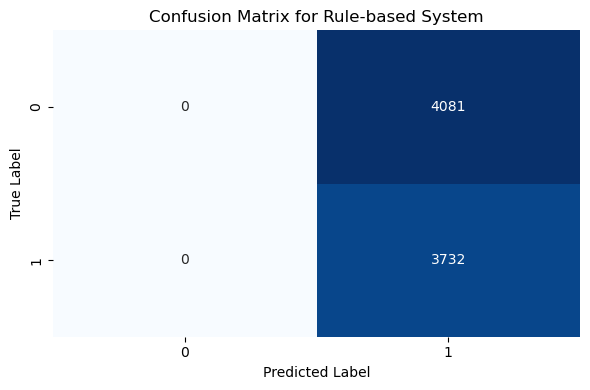

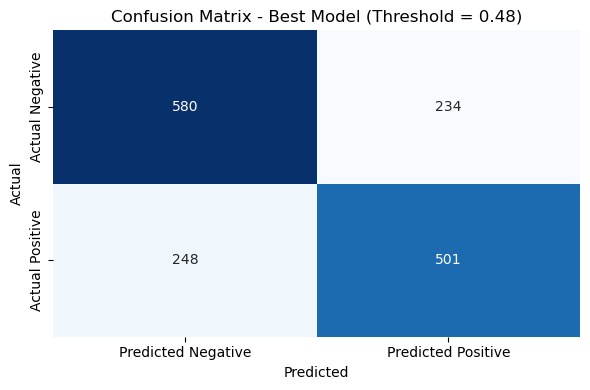

In [138]:
# Tampilkan heatmap confusion matrix untuk rule-based system
plt.figure(figsize=(6, 4))
sns.heatmap(cm_rule, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix for Rule-based System')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.tight_layout()
plt.show()

plot_confusion_matrix(y_test, y_pred_custom_threshold, model_name="Best Model", threshold=best_threshold)

## Berikut adalah insight penting perbandingan antara sistem `rule-based` dan `model based`:
1. Pendekatan Prediksi:
    * Sistem berbasis aturan memprediksi semua kasus sebagai positif (akan melakukan deposit).
    * Model machine learning memberikan prediksi yang lebih nuansa dan seimbang.
2. Akurasi dan Presisi:
    * Model machine learning memiliki akurasi lebih tinggi, mampu membedakan nasabah yang cenderung dan tidak cenderung melakukan deposit.
    * Sistem berbasis aturan memiliki recall sempurna (100%) tetapi presisi sangat rendah (47.8%).
3. False Positives:
    * Sistem berbasis aturan: 4081 false positives
    * Model machine learning: 234 false positives
    * Model ML secara signifikan mengurangi false positives, meningkatkan efisiensi kampanye.
4. Keseimbangan Prediksi:
    * Model ML memberikan 735 prediksi positif dan 828 prediksi negatif, mencerminkan distribusi yang lebih realistis.
    * Sistem berbasis aturan memprediksi 7813 positif, yang tidak realistis.
5. Efisiensi Operasional:
    * Model ML dapat menghemat sumber daya dengan mengurangi jumlah nasabah yang dihubungi secara tidak perlu (dari 7813 menjadi 735).
6. False Negatives:
    * Sistem berbasis aturan: 0 false negatives
    * Model ML: 248 false negatives
    * Model ML memiliki risiko kehilangan beberapa nasabah potensial, namun trade-off ini menghasilkan efisiensi lebih tinggi secara keseluruhan.
7. Fleksibilitas:
    * Model ML menawarkan fleksibilitas dengan threshold yang dapat disesuaikan (saat ini 0.48).
8. Metrik Performa:
    * Model ML: Presisi = 501 / (501 + 234) = 68.16% Recall = 501 / (501 + 248) = 66.89% F1-score = 2 * (Presisi * Recall) / (Presisi + Recall) = 67.52%
    * Sistem berbasis aturan: Presisi = 3732 / 7813 = 47.77% Recall = 100% F1-score = 64.65%

**Kesimpulan:** Model machine learning menunjukkan peningkatan signifikan dalam efisiensi dan efektivitas prediksi nasabah yang akan melakukan deposit. Meskipun ada trade-off dalam hal false negatives, pengurangan drastis false positives dan peningkatan presisi membuat model ML jauh lebih menguntungkan untuk kampanye pemasaran bank. Model ini memungkinkan alokasi sumber daya yang lebih efisien dan targetted, yang berpotensi meningkatkan ROI kampanye secara substansial.


# **Business Outcome Evaluation - Rule Based vs Machine Learning Based**

## **Kita akan mengasumsikan beberapa nilai untuk perhitungan ini.**

Asumsi:
* Rata-rata deposito: Rp 100.000.000
* Tingkat bunga deposito: 5% per tahun
* Biaya pemasaran per nasabah: Rp 1.000.000

#### 1. Sistem Berbasis Aturan (Rule-based System)
**Dari confusion matrix:**
* True Positive (TP): 3732
* False Positive (FP): 4081
* False Negative (FN): 0
* True Negative (TN): 0

a. Peluang pemasukan dana deposito = $\frac{TP} {TP + FN} = \frac{3732} {3732 + 0} = 100\%$

b. Peluang opportunity cost = $\frac{FN}{TP + FN} = \frac{0}{3732 + 0} = 0\%$

c. Peluang biaya sia-sia = $\frac{FP}{FP + TP} = \frac{4081}{4081 + 3732} = 52.23\%$

d. Peluang keuntungan kotor = $\frac{(TP \times \text{Rata-rata deposito} \times \text{Tingkat bunga}) - (\text{Total prediksi} \times \text{Biaya pemasaran})}{\text{Total prediksi} \times \text{Biaya pemasaran}} = \frac{(3732 \times 100.000.000 \times 0.05) - (7813 \times 1.000.000)}{7813 \times 1.000.000} = 138.85\%$
<br>
<br>

#### 2. Model Pembelajaran Mesin (Best Model dengan Threshold 0.48)
**Dari confusion matrix:**
* True Positive (TP): 501
* False Positive (FP): 234
* False Negative (FN): 248
* True Negative (TN): 580

a. Peluang pemasukan dana deposito = $\frac{TP}{TP + FN} = \frac{501}{501 + 248} = 66.88\%$

b. Peluang opportunity cost = $\frac{FN}{TP + FN} = \frac{248}{501 + 248} = 33.12\%$

c. Peluang biaya sia-sia = $\frac{FP}{FP + TP} = \frac{234}{234 + 501} = 31.83\%$

d. Peluang keuntungan kotor = $\frac{(TP \times \text{Rata-rata deposito} \times \text{Tingkat bunga}) - (\text{FP + TP} \times \text{Biaya pemasaran})}{(\text{FP + TP}) \times \text{Biaya pemasaran}} = \frac{(501 \times 100.000.000 \times 0.05) - (234 + 501) \times 1.000.000}{(234 + 501) \times 1.000.000} = 240.79\%$

**Perbandingan:**
1. Peluang pemasukan dana deposito:
* Rule-based: 100% (terlihat sangat tinggi, namun menyesatkan).
* Machine Learning: `66.88%` (lebih realistis).

2. Opportunity cost:
* Rule-based: 0% (tidak realistis, karena tidak ada prediksi negatif).
* Machine Learning: `33.12%` (lebih akurat).

3. Peluang biaya sia-sia:
* Rule-based: 52.23% (sangat tinggi).
* Machine Learning: `31.83%` (lebih efisien).

4. Peluang keuntungan kotor:
* Rule-based: 138.85%.
* Machine Learning: `240.79%` (lebih menguntungkan).

**Kesimpulan:** 

Meskipun sistem berbasis aturan memprediksi semua pelanggan sebagai pelanggan yang melakukan deposit dan menghasilkan peluang pemasukan yang tinggi, ini tidak mencerminkan efisiensi yang sebenarnya. Sebaliknya, `machine learning based` memberikan pendekatan yang lebih seimbang dengan peluang biaya sia-sia yang lebih rendah dan potensi keuntungan kotor yang jauh lebih tinggi. Ini menunjukkan bahwa penggunaan model pembelajaran mesin lebih efisien dan menguntungkan dalam jangka panjang.

# Conclusion & Recommendation 

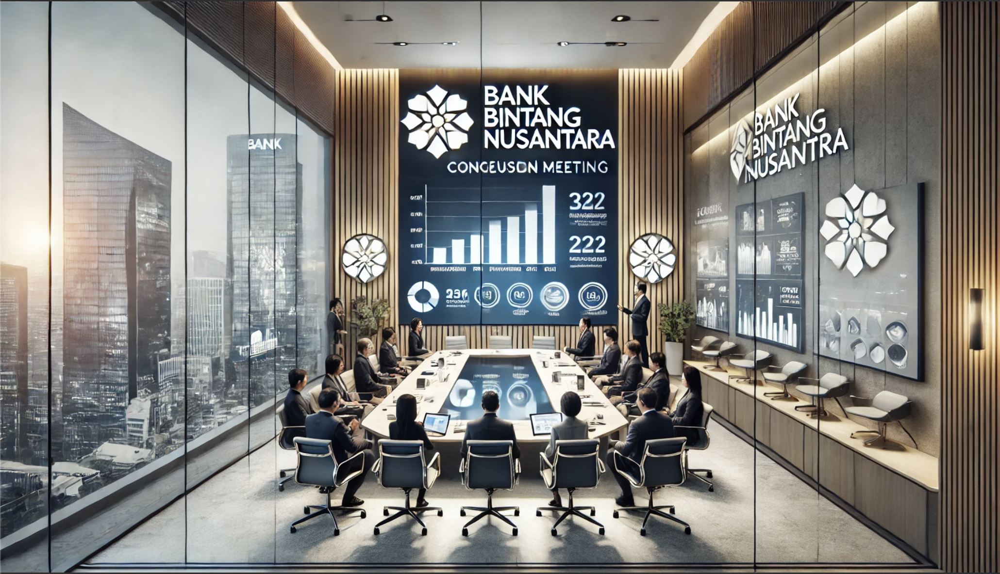

## CONCLUSION

1. Efektivitas Model: Model pembelajaran mesin menunjukkan performa yang jauh lebih baik dibandingkan sistem berbasis aturan dalam memprediksi nasabah yang akan melakukan deposit.
2. Efisiensi Biaya: Model pembelajaran mesin mengurangi peluang biaya sia-sia secara signifikan (31.83% vs 52.23%), yang berarti alokasi sumber daya pemasaran yang lebih efisien.
3. Potensi Keuntungan: Peluang keuntungan kotor dari model pembelajaran mesin (240.79%) jauh melampaui sistem berbasis aturan (138.85%), menunjukkan potensi ROI yang lebih tinggi.
4. Keseimbangan Prediksi: Model pembelajaran mesin menawarkan pendekatan yang lebih seimbang dan realistis dalam mengidentifikasi nasabah potensial, dengan mempertimbangkan baik peluang positif maupun negatif.
5. Optimisasi Kampanye: Dengan mengurangi false positives, model pembelajaran mesin memungkinkan bank untuk fokus pada nasabah yang lebih mungkin melakukan deposit, meningkatkan efektivitas kampanye pemasaran.

## RECOMMENDATION

**Rekomendasi Bisnis:**
1. Implementasi Model ML: Adopsi model pembelajaran mesin untuk kampanye pemasaran deposit, menggantikan atau melengkapi sistem berbasis aturan yang ada.
2. Segmentasi Nasabah: Gunakan insight dari model untuk mengembangkan strategi segmentasi nasabah yang lebih canggih, memungkinkan pendekatan pemasaran yang lebih personal.
3. Alokasi Sumber Daya: Realokasi anggaran pemasaran berdasarkan prediksi model, fokus pada nasabah dengan probabilitas deposit tinggi.
4. Program Retensi: Kembangkan program retensi khusus untuk nasabah yang diprediksi memiliki peluang tinggi untuk melakukan deposit, meningkatkan loyalitas dan nilai seumur hidup nasabah.
5. Analisis ROI: Lakukan analisis ROI berkala untuk mengukur dampak implementasi model terhadap performa kampanye dan profitabilitas keseluruhan.
6. Pelatihan Tim: Latih tim pemasaran dan layanan nasabah untuk menggunakan insight dari model dalam interaksi mereka dengan nasabah.

**Rekomendasi Model:**
1. Optimisasi Threshold: Lakukan fine-tuning threshold prediksi (saat ini 0.48) secara berkala untuk memaksimalkan F1-score atau metrik bisnis yang relevan.
2. Monitoring Performa: Implementasikan sistem monitoring real-time untuk memantau performa model dan mendeteksi pergeseran dalam pola data.
3. Updating Berkala: Rencanakan update model secara berkala (misalnya, setiap 3-6 bulan) untuk memastikan relevansi terhadap perubahan perilaku nasabah atau kondisi pasar.
4. Feature Engineering: Terus eksplorasi dan kembangkan fitur baru yang mungkin meningkatkan akurasi prediksi, seperti data transaksi terbaru atau interaksi nasabah dengan bank.
5. Ensemble Methods: Pertimbangkan penggunaan teknik ensemble, menggabungkan kekuatan dari beberapa model (misalnya, SVM, Random Forest, dan Gradient Boosting) untuk meningkatkan akurasi prediksi.
6. Interpretabilitas: Integrasikan teknik interpretabilitas model (seperti SHAP values) untuk memahami faktor-faktor yang mempengaruhi prediksi, memberikan insight tambahan untuk strategi bisnis.
7. A/B Testing: Lakukan A/B testing untuk membandingkan performa model pembelajaran mesin dengan pendekatan tradisional dalam skenario nyata, memvalidasi efektivitasnya sebelum implementasi penuh.
Dengan mengimplementasikan rekomendasi ini, bank dapat mengoptimalkan strategi pemasaran deposit, meningkatkan efisiensi operasional, dan pada akhirnya meningkatkan profitabilitas melalui pemanfaatan yang efektif dari model pembelajaran mesin.


In [146]:
import pickle

In [147]:
#Concat train and test label data
data_final_model_X = pd.concat([X_train_cleaned,X_test_cleaned])
data_final_model_X

,age,age_group_elderly,age_group_senior,age_group_young,balance_category_medium,balance_category_negative,campaign_category_medium,pdays_category_medium,pdays_category_short,job_category_business,job_category_not_working,job_category_service,job_category_unknown,job_category_white_collar,season_spring,season_summer,season_winter,is_new_customer,previous_success,has_credit
1158,-1.058824,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
4680,-0.647059,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
3731,-0.705882,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
6141,-0.176471,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
4266,0.058824,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5001,0.588235,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
5221,1.470588,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2445,0.411765,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
1731,2.647059,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0


In [148]:
#Concat train and test label data
data_final_model_y = pd.concat([y_train,y_test])
pd.DataFrame(data_final_model_y)

,deposit
1158,1
4680,1
3731,1
6141,0
4266,0
...,...
5001,0
5221,1
2445,1
1731,1


In [149]:
#Fit model ke fitur seluruh data
gscv.best_estimator_.fit(data_final_model_X,data_final_model_y)

Pipeline(steps=[('feature_selection', SelectKBest(k=20)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME', n_estimators=200,
                                    random_state=42))])

In [185]:
#Saving models

filename = 'Model Final.sav'

## Uncomment code dibawah untuk saving file model
pickle.dump(best_model,open(filename,'wb'))